In [1]:
import mdtraj as md
import numpy as np
import pickle
import os
from tqdm import tqdm_notebook
from simtk.openmm import app
from simtk.openmm import unit
import matplotlib.pyplot as plt


## Load htf and trajs for analysis

In [2]:
outdir = "/data/chodera/zhangi/perses_benchmark/neq/15/83"
outdir_rest = "/data/chodera/zhangi/perses_benchmark/neq/14/83"
i = 83
phase = 'complex'
cycle = 0

In [3]:
htf = pickle.load(open(os.path.join(outdir, f"{i}_{phase}.pickle"), "rb"))

In [4]:
with open(os.path.join(outdir, f"{i}_{phase}_{cycle}_forward_neq_new.npy"), 'rb') as f:
    neq_new = np.load(f)

In [5]:
with open(os.path.join(outdir_rest, f"{i}_{phase}_tyr_1ns_snapshots.npy"), 'rb') as f:
    rest_tyr = np.load(f)

In [6]:
modeller = app.Modeller(htf._topology_proposal.new_topology, htf.new_positions(htf.hybrid_positions))
modeller.deleteWater()

In [7]:
top = md.Topology.from_openmm(modeller.topology)

In [8]:
traj = md.Trajectory(np.array(neq_new), top)


In [6]:
def new_positions(hybrid_positions):
    n_atoms_new = htf._topology_proposal.n_atoms_new
    hybrid_indices = [htf._new_to_hybrid_map[idx] for idx in range(n_atoms_new)]
    return hybrid_positions[hybrid_indices, :]
    
def old_positions(hybrid_positions):
    n_atoms_old = htf._topology_proposal.n_atoms_old
    hybrid_indices = [htf._old_to_hybrid_map[idx] for idx in range(n_atoms_old)]
    return hybrid_positions[hybrid_indices, :]

def make_traj(outdir, htf, i, phase, name, endstate, is_old=True, keep_solvent=False):
    with open(os.path.join(outdir, f"{i}_{phase}_{name}_1ns_snapshots.npy"), "rb") as f:
        cache = np.load(f)
    if is_old:
        old_pos = np.zeros(shape=(100, htf._topology_proposal.old_topology.getNumAtoms(), 3))
        for j, pos in tqdm_notebook(enumerate(cache)):
            old_pos[j] = old_positions(unit.Quantity(pos, unit=unit.nanometers)).value_in_unit_system(unit.md_unit_system)
        
        traj = md.Trajectory(old_pos, md.Topology.from_openmm(htf._topology_proposal.old_topology))
    else:
        new_pos = np.zeros(shape=(100, htf._topology_proposal.new_topology.getNumAtoms(), 3))
        for j, pos in tqdm_notebook(enumerate(cache)):
            new_pos[j] = new_positions(unit.Quantity(pos, unit=unit.nanometers)).value_in_unit_system(unit.md_unit_system)
        
        traj = md.Trajectory(new_pos, md.Topology.from_openmm(htf._topology_proposal.new_topology))
        
    box_vectors = np.array([val.value_in_unit_system(unit.md_unit_system) for val in htf.hybrid_system.getDefaultPeriodicBoxVectors()])
    vectors = np.array([box_vectors]) 
           
    # Set unit cell vectors in traj 
    traj.unitcell_vectors = np.repeat(vectors, 100, axis=0)
    traj.image_molecules(inplace=True)
    
    if not keep_solvent:
        traj = traj.remove_solvent(exclude=['Na+', 'Cl-'])
    
    return traj
       

In [7]:
name = "tyr"
endstate = 1
is_old = False
traj_rest = make_traj(outdir_rest, htf, i, phase, name, endstate, is_old)

<ipython-input-6-45ff68d441e7>:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for j, pos in tqdm_notebook(enumerate(cache)):


0it [00:00, ?it/s]

ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


In [11]:
traj

<mdtraj.Trajectory with 100 frames, 16305 atoms, 1299 residues, without unitcells at 0x2ac33e693490>

In [12]:
traj_rest

<mdtraj.Trajectory with 100 frames, 16303 atoms, 1297 residues, and unitcells at 0x2ac353c123a0>

(array([64.,  1.,  0.,  0.,  0.,  0.,  0.,  3., 16., 16.]),
 array([-3.1380994, -2.5111845, -1.8842696, -1.2573547, -0.6304398,
        -0.0035249,  0.62339  ,  1.2503049,  1.8772198,  2.5041347,
         3.1310496], dtype=float32),
 <BarContainer object of 10 artists>)

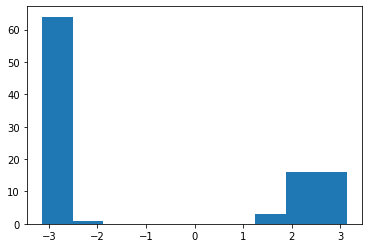

In [170]:
plt.hist(md.compute_dihedrals(traj_rest, [[2607, 2609, 2612, 2613]]))

(-3.0, 3.0)

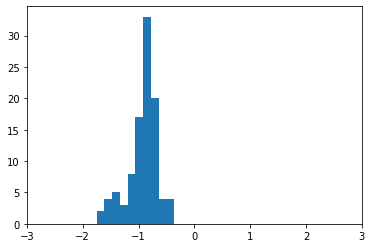

In [178]:
plt.hist(md.compute_dihedrals(traj_rest, [[3492, 3494, 3496, 3499]])) # HIS34 chi1
plt.xlim([-3, 3])

## Determine all residues within 7 ang of Y501

In [13]:
tyr_atoms = []
for atom in top.atoms:
    if atom.residue.resSeq == 501 and atom.residue.name == 'TYR':
        print(atom, atom.residue.resSeq, atom.index)
        tyr_atoms.append(atom.index)

TYR501-N 501 2605
TYR501-H 501 2606
TYR501-CA 501 2607
TYR501-HA 501 2608
TYR501-CB 501 2609
TYR501-HB2 501 2610
TYR501-HB3 501 2611
TYR501-CG 501 2612
TYR501-CD1 501 2613
TYR501-HD1 501 2614
TYR501-CE1 501 2615
TYR501-HE1 501 2616
TYR501-CZ 501 2617
TYR501-OH 501 2618
TYR501-HH 501 2619
TYR501-CE2 501 2620
TYR501-HE2 501 2621
TYR501-CD2 501 2622
TYR501-HD2 501 2623
TYR501-C 501 2624
TYR501-O 501 2625


In [14]:
protein_atoms = top.select("protein")

In [15]:
for atom in top.atoms:
    if atom.index in protein_atoms:
        print(atom)

ACE332-H1
ACE332-CH3
ACE332-H2
ACE332-H3
ACE332-C
ACE332-O
THR333-N
THR333-H
THR333-CA
THR333-HA
THR333-CB
THR333-HB
THR333-CG2
THR333-HG21
THR333-HG22
THR333-HG23
THR333-OG1
THR333-HG1
THR333-C
THR333-O
ASN334-N
ASN334-H
ASN334-CA
ASN334-HA
ASN334-CB
ASN334-HB2
ASN334-HB3
ASN334-CG
ASN334-OD1
ASN334-ND2
ASN334-HD21
ASN334-HD22
ASN334-C
ASN334-O
LEU335-N
LEU335-H
LEU335-CA
LEU335-HA
LEU335-CB
LEU335-HB2
LEU335-HB3
LEU335-CG
LEU335-HG
LEU335-CD1
LEU335-HD11
LEU335-HD12
LEU335-HD13
LEU335-CD2
LEU335-HD21
LEU335-HD22
LEU335-HD23
LEU335-C
LEU335-O
CYS336-N
CYS336-H
CYS336-CA
CYS336-HA
CYS336-CB
CYS336-HB2
CYS336-HB3
CYS336-SG
CYS336-C
CYS336-O
PRO337-N
PRO337-CD
PRO337-HD2
PRO337-HD3
PRO337-CG
PRO337-HG2
PRO337-HG3
PRO337-CB
PRO337-HB2
PRO337-HB3
PRO337-CA
PRO337-HA
PRO337-C
PRO337-O
PHE338-N
PHE338-H
PHE338-CA
PHE338-HA
PHE338-CB
PHE338-HB2
PHE338-HB3
PHE338-CG
PHE338-CD1
PHE338-HD1
PHE338-CE1
PHE338-HE1
PHE338-CZ
PHE338-HZ
PHE338-CE2
PHE338-HE2
PHE338-CD2
PHE338-HD2
PHE338-C
PHE338-O
GLY

TRP69-CD2
TRP69-C
TRP69-O
SER70-N
SER70-H
SER70-CA
SER70-HA
SER70-CB
SER70-HB2
SER70-HB3
SER70-OG
SER70-HG
SER70-C
SER70-O
ALA71-N
ALA71-H
ALA71-CA
ALA71-HA
ALA71-CB
ALA71-HB1
ALA71-HB2
ALA71-HB3
ALA71-C
ALA71-O
PHE72-N
PHE72-H
PHE72-CA
PHE72-HA
PHE72-CB
PHE72-HB2
PHE72-HB3
PHE72-CG
PHE72-CD1
PHE72-HD1
PHE72-CE1
PHE72-HE1
PHE72-CZ
PHE72-HZ
PHE72-CE2
PHE72-HE2
PHE72-CD2
PHE72-HD2
PHE72-C
PHE72-O
LEU73-N
LEU73-H
LEU73-CA
LEU73-HA
LEU73-CB
LEU73-HB2
LEU73-HB3
LEU73-CG
LEU73-HG
LEU73-CD1
LEU73-HD11
LEU73-HD12
LEU73-HD13
LEU73-CD2
LEU73-HD21
LEU73-HD22
LEU73-HD23
LEU73-C
LEU73-O
LYS74-N
LYS74-H
LYS74-CA
LYS74-HA
LYS74-CB
LYS74-HB2
LYS74-HB3
LYS74-CG
LYS74-HG2
LYS74-HG3
LYS74-CD
LYS74-HD2
LYS74-HD3
LYS74-CE
LYS74-HE2
LYS74-HE3
LYS74-NZ
LYS74-HZ1
LYS74-HZ2
LYS74-HZ3
LYS74-C
LYS74-O
GLU75-N
GLU75-H
GLU75-CA
GLU75-HA
GLU75-CB
GLU75-HB2
GLU75-HB3
GLU75-CG
GLU75-HG2
GLU75-HG3
GLU75-CD
GLU75-OE1
GLU75-OE2
GLU75-C
GLU75-O
GLN76-N
GLN76-H
GLN76-CA
GLN76-HA
GLN76-CB
GLN76-HB2
GLN76-HB3
GLN76-CG
GLN76

TRP165-HB2
TRP165-HB3
TRP165-CG
TRP165-CD1
TRP165-HD1
TRP165-NE1
TRP165-HE1
TRP165-CE2
TRP165-CZ2
TRP165-HZ2
TRP165-CH2
TRP165-HH2
TRP165-CZ3
TRP165-HZ3
TRP165-CE3
TRP165-HE3
TRP165-CD2
TRP165-C
TRP165-O
GLU166-N
GLU166-H
GLU166-CA
GLU166-HA
GLU166-CB
GLU166-HB2
GLU166-HB3
GLU166-CG
GLU166-HG2
GLU166-HG3
GLU166-CD
GLU166-OE1
GLU166-OE2
GLU166-C
GLU166-O
SER167-N
SER167-H
SER167-CA
SER167-HA
SER167-CB
SER167-HB2
SER167-HB3
SER167-OG
SER167-HG
SER167-C
SER167-O
TRP168-N
TRP168-H
TRP168-CA
TRP168-HA
TRP168-CB
TRP168-HB2
TRP168-HB3
TRP168-CG
TRP168-CD1
TRP168-HD1
TRP168-NE1
TRP168-HE1
TRP168-CE2
TRP168-CZ2
TRP168-HZ2
TRP168-CH2
TRP168-HH2
TRP168-CZ3
TRP168-HZ3
TRP168-CE3
TRP168-HE3
TRP168-CD2
TRP168-C
TRP168-O
ARG169-N
ARG169-H
ARG169-CA
ARG169-HA
ARG169-CB
ARG169-HB2
ARG169-HB3
ARG169-CG
ARG169-HG2
ARG169-HG3
ARG169-CD
ARG169-HD2
ARG169-HD3
ARG169-NE
ARG169-HE
ARG169-CZ
ARG169-NH1
ARG169-HH11
ARG169-HH12
ARG169-NH2
ARG169-HH21
ARG169-HH22
ARG169-C
ARG169-O
SER170-N
SER170-H
SER170-CA
SER1

TRP477-CD2
TRP477-C
TRP477-O
TRP478-N
TRP478-H
TRP478-CA
TRP478-HA
TRP478-CB
TRP478-HB2
TRP478-HB3
TRP478-CG
TRP478-CD1
TRP478-HD1
TRP478-NE1
TRP478-HE1
TRP478-CE2
TRP478-CZ2
TRP478-HZ2
TRP478-CH2
TRP478-HH2
TRP478-CZ3
TRP478-HZ3
TRP478-CE3
TRP478-HE3
TRP478-CD2
TRP478-C
TRP478-O
GLU479-N
GLU479-H
GLU479-CA
GLU479-HA
GLU479-CB
GLU479-HB2
GLU479-HB3
GLU479-CG
GLU479-HG2
GLU479-HG3
GLU479-CD
GLU479-OE1
GLU479-OE2
GLU479-C
GLU479-O
MET480-N
MET480-H
MET480-CA
MET480-HA
MET480-CB
MET480-HB2
MET480-HB3
MET480-CG
MET480-HG2
MET480-HG3
MET480-SD
MET480-CE
MET480-HE1
MET480-HE2
MET480-HE3
MET480-C
MET480-O
LYS481-N
LYS481-H
LYS481-CA
LYS481-HA
LYS481-CB
LYS481-HB2
LYS481-HB3
LYS481-CG
LYS481-HG2
LYS481-HG3
LYS481-CD
LYS481-HD2
LYS481-HD3
LYS481-CE
LYS481-HE2
LYS481-HE3
LYS481-NZ
LYS481-HZ1
LYS481-HZ2
LYS481-HZ3
LYS481-C
LYS481-O
ARG482-N
ARG482-H
ARG482-CA
ARG482-HA
ARG482-CB
ARG482-HB2
ARG482-HB3
ARG482-CG
ARG482-HG2
ARG482-HG3
ARG482-CD
ARG482-HD2
ARG482-HD3
ARG482-NE
ARG482-HE
ARG482-CZ
ARG

GLU571-HG3
GLU571-CD
GLU571-OE1
GLU571-OE2
GLU571-C
GLU571-O
ASN572-N
ASN572-H
ASN572-CA
ASN572-HA
ASN572-CB
ASN572-HB2
ASN572-HB3
ASN572-CG
ASN572-OD1
ASN572-ND2
ASN572-HD21
ASN572-HD22
ASN572-C
ASN572-O
VAL573-N
VAL573-H
VAL573-CA
VAL573-HA
VAL573-CB
VAL573-HB
VAL573-CG1
VAL573-HG11
VAL573-HG12
VAL573-HG13
VAL573-CG2
VAL573-HG21
VAL573-HG22
VAL573-HG23
VAL573-C
VAL573-O
VAL574-N
VAL574-H
VAL574-CA
VAL574-HA
VAL574-CB
VAL574-HB
VAL574-CG1
VAL574-HG11
VAL574-HG12
VAL574-HG13
VAL574-CG2
VAL574-HG21
VAL574-HG22
VAL574-HG23
VAL574-C
VAL574-O
GLY575-N
GLY575-H
GLY575-CA
GLY575-HA2
GLY575-HA3
GLY575-C
GLY575-O
ALA576-N
ALA576-H
ALA576-CA
ALA576-HA
ALA576-CB
ALA576-HB1
ALA576-HB2
ALA576-HB3
ALA576-C
ALA576-O
LYS577-N
LYS577-H
LYS577-CA
LYS577-HA
LYS577-CB
LYS577-HB2
LYS577-HB3
LYS577-CG
LYS577-HG2
LYS577-HG3
LYS577-CD
LYS577-HD2
LYS577-HD3
LYS577-CE
LYS577-HE2
LYS577-HE3
LYS577-NZ
LYS577-HZ1
LYS577-HZ2
LYS577-HZ3
LYS577-C
LYS577-O
ASN578-N
ASN578-H
ASN578-CA
ASN578-HA
ASN578-CB
ASN578-HB2
AS

In [16]:
traj_84 = traj[84]


In [17]:
neighbors = md.compute_neighbors(traj_84, 0.7, tyr_atoms, haystack_indices=protein_atoms)

<ipython-input-17-2b45ee2e5306>:1: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  neighbors = md.compute_neighbors(traj_84, 0.7, tyr_atoms, haystack_indices=protein_atoms)


In [18]:
neighbors_residues = set([atom.residue for atom in top.atoms if atom.index in neighbors[0]])

In [19]:
len(neighbors_residues)

38

In [20]:
neighbors_residues

{ARG357,
 ARG403,
 ASN330,
 ASN437,
 ASN439,
 ASN448,
 ASP355,
 ASP38,
 GLN42,
 GLN498,
 GLN506,
 GLU37,
 GLY326,
 GLY352,
 GLY354,
 GLY404,
 GLY447,
 GLY496,
 GLY502,
 GLY504,
 HIS34,
 LEU351,
 LEU45,
 LYS353,
 PHE356,
 PHE497,
 PRO499,
 PRO507,
 SER443,
 SER494,
 THR324,
 THR500,
 TYR41,
 TYR449,
 TYR495,
 TYR501,
 TYR505,
 VAL503}

In [67]:
# Make map of residue to atom indices
d_map = {}
for res in neighbors_residues:
    d_map[f"{res.name}-{res.resSeq}"] = [atom.index for atom in res.atoms]

## Compute all angles

In [21]:
indices_phi_neq, angles_phi_neq = md.compute_phi(traj_84)
indices_psi_neq, angles_psi_neq = md.compute_psi(traj_84)
indices_chi1_neq, angles_chi1_neq = md.compute_chi1(traj_84)
indices_chi2_neq, angles_chi2_neq = md.compute_chi2(traj_84)
indices_chi3_neq, angles_chi3_neq = md.compute_chi3(traj_84)
indices_chi4_neq, angles_chi4_neq = md.compute_chi4(traj_84)

In [22]:
indices_phi_rest, angles_phi_rest = md.compute_phi(traj_rest[84])
indices_psi_rest, angles_psi_rest = md.compute_psi(traj_rest[84])
indices_chi1_rest, angles_chi1_rest = md.compute_chi1(traj_rest[84])
indices_chi2_rest, angles_chi2_rest = md.compute_chi2(traj_rest[84])
indices_chi3_rest, angles_chi3_rest = md.compute_chi3(traj_rest[84])
indices_chi4_rest, angles_chi4_rest = md.compute_chi4(traj_rest[84])

In [41]:
# Check that the angles computed in the same order for neq vs rest
for index_neq, index_rest in zip(indices_chi1_neq, indices_chi1_rest):
    assert np.array_equal(index_neq, index_rest)

## Get residues that have diff angles in neq vs rest

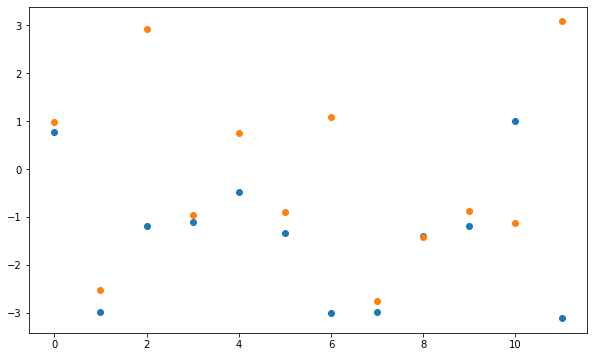

In [28]:
plt.figure(figsize=(10, 6))
# plt.scatter(list(range(angles_chi1_neq.shape[1])), angles_chi1_neq[:10])
# plt.scatter(list(range(angles_chi1_rest.shape[1])), angles_chi1_rest[:10])
plt.scatter(list(range(12)), angles_chi1_neq[0][:12])
plt.scatter(list(range(12)), angles_chi1_rest[0][:12])

In [35]:
# Get list of indices (angle_type, angle_index) where the angles differ between neq and rest
angles_neq_all = [angles_phi_neq, angles_psi_neq, angles_chi1_neq, angles_chi2_neq, angles_chi3_neq, angles_chi4_neq]
angles_rest_all = [angles_phi_rest, angles_psi_rest, angles_chi1_rest, angles_chi2_rest, angles_chi3_rest, angles_chi4_rest]
indices_neq_all = [indices_phi_neq, indices_psi_neq, indices_chi1_neq, indices_chi2_neq, indices_chi3_neq, indices_chi4_neq]
indices_rest_all = [indices_phi_rest, indices_psi_rest, indices_chi1_rest, indices_chi2_rest, indices_chi3_rest, indices_chi4_rest]

indices = []
for i, (angles_neq, angles_rest) in enumerate(zip(angles_neq_all, angles_rest_all)):
    for j, (angle_neq, angle_rest) in enumerate(zip(angles_neq[0], angles_rest[0])):
        if abs(angle_neq - angle_rest) > 1 and  abs(angle_neq - angle_rest) < 5.5:
            indices.append((i, j))
            print (j, angle_neq, angle_rest)
        

45 -2.1758277 -1.0891583
143 2.7970521 -2.1962984
183 -1.2017725 -2.4060075
444 -1.0571394 -2.4955716
520 -2.910372 -1.116749
525 -1.4226812 -2.5981688
604 -1.31844 -2.5742507
621 -2.5402362 -1.4371685
712 -1.6118503 -2.970544
808 -2.5472023 -1.3448025
811 -1.1601166 -2.788146
899 -1.3118947 -2.6022544
44 1.8095012 0.60660565
117 -0.9331818 0.42419508
184 0.03882101 1.7473212
185 2.4307532 -2.9468768
194 2.7232132 -0.63305116
307 2.3340743 -3.1126418
512 -2.4717782 3.026119
519 1.6098584 -0.09562514
620 -0.04798288 -1.1075746
667 2.342279 -3.0164428
711 0.23773849 1.2584972
810 1.2909157 2.5874977
2 -1.1827291 2.9207656
4 -0.484596 0.75696516
6 -3.000346 1.0934399
10 0.99446917 -1.1379182
17 -2.8637314 -1.4332913
19 -1.1955476 -3.0156386
33 -2.7369778 1.4342827
37 -1.3689082 -3.0771816
43 -2.9636302 1.0967019
96 -1.0202781 1.1572798
100 3.1178565 1.090824
108 -2.497285 -1.1359212
120 1.3741249 -0.7527011
121 0.876113 -3.060562
133 1.3671274 -0.9969664
140 -0.79652226 -2.937287
156 -1.0

In [34]:
len(indices)

356

In [70]:
# Make map of angle types to indices
d_map_angles = {0: "phi", 1: "psi", 2: "chi1", 3: "chi2", 4: "chi3", 5: "chi4"}


In [71]:
# Get residue names for the angles that are changing
for angle_type, angle_index in indices:
    dihedral_atoms = indices_neq_all[angle_type][angle_index]
    residues = []
    for atom in dihedral_atoms:
        for res, atoms in d_map.items():
            if atom in atoms:
                residues.append(res)
                continue
    residues = set(residues)
    if residues:
        print(dihedral_atoms, residues, d_map_angles[angle_type], angles_neq_all[angle_type][0][angle_index], angles_rest_all[angle_type][0][angle_index])
            
                
                

[2501 2503 2505 2508] {'SER-494'} chi1 -0.79652226 -2.937287
[3492 3494 3496 3499] {'HIS-34'} chi1 3.1307752 -0.87013483
[3549 3551 3553 3556] {'ASP-38'} chi1 -3.1302636 -1.3445787
[2607 2609 2612 2613] {'TYR-501'} chi2 0.15153733 -2.8084686
[3494 3496 3499 3500] {'HIS-34'} chi2 -1.7509366 1.2608483
[3623 3625 3628 3631] {'GLN-42'} chi2 2.9723744 -1.1237237
[8502 8504 8507 8509] {'LEU-351'} chi2 -2.890979 0.98762953
[8528 8530 8533 8536] {'LYS-353'} chi2 -2.5135913 -1.3494954
[1091 1094 1097 1100] {'ARG-403'} chi3 -1.2282032 -3.0029073
[3625 3628 3631 3632] {'GLN-42'} chi3 1.2325821 -0.46844092
[1094 1097 1100 1102] {'ARG-403'} chi4 -3.0925028 2.1552489


## Compute all angles for all frames

In [75]:
indices_phi_neq, angles_phi_neq = md.compute_phi(traj)
indices_psi_neq, angles_psi_neq = md.compute_psi(traj)
indices_chi1_neq, angles_chi1_neq = md.compute_chi1(traj)
indices_chi2_neq, angles_chi2_neq = md.compute_chi2(traj)
indices_chi3_neq, angles_chi3_neq = md.compute_chi3(traj)
indices_chi4_neq, angles_chi4_neq = md.compute_chi4(traj)

In [76]:
indices_phi_rest, angles_phi_rest = md.compute_phi(traj_rest)
indices_psi_rest, angles_psi_rest = md.compute_psi(traj_rest)
indices_chi1_rest, angles_chi1_rest = md.compute_chi1(traj_rest)
indices_chi2_rest, angles_chi2_rest = md.compute_chi2(traj_rest)
indices_chi3_rest, angles_chi3_rest = md.compute_chi3(traj_rest)
indices_chi4_rest, angles_chi4_rest = md.compute_chi4(traj_rest)

In [77]:
# Check that the angles computed in the same order for neq vs rest
for index_neq, index_rest in zip(indices_chi1_neq, indices_chi1_rest):
    assert np.array_equal(index_neq, index_rest)

## Get residues that have diff angles in neq vs rest (all frames)

In [79]:
angles_phi_neq.shape

(100, 901)

In [81]:
# Get list of indices (angle_type, angle_index) where the angles differ between neq and rest
angles_neq_all = [angles_phi_neq, angles_psi_neq, angles_chi1_neq, angles_chi2_neq, angles_chi3_neq, angles_chi4_neq]
angles_rest_all = [angles_phi_rest, angles_psi_rest, angles_chi1_rest, angles_chi2_rest, angles_chi3_rest, angles_chi4_rest]
indices_neq_all = [indices_phi_neq, indices_psi_neq, indices_chi1_neq, indices_chi2_neq, indices_chi3_neq, indices_chi4_neq]
indices_rest_all = [indices_phi_rest, indices_psi_rest, indices_chi1_rest, indices_chi2_rest, indices_chi3_rest, indices_chi4_rest]

d_indices = {}
for frame in range(traj.n_frames):
    indices = []
    for i, (angles_neq, angles_rest) in enumerate(zip(angles_neq_all, angles_rest_all)):
        for j, (angle_neq, angle_rest) in enumerate(zip(angles_neq[frame], angles_rest[frame])):
            if abs(angle_neq - angle_rest) > 1 and  abs(angle_neq - angle_rest) < 5.5:
                indices.append((i, j))
    d_indices[frame] = indices
        

In [86]:
# Make map of angle types to indices
d_map_angles = {0: "phi", 1: "psi", 2: "chi1", 3: "chi2", 4: "chi3", 5: "chi4"}


In [93]:
indices_neq_all[0].shape

(901, 4)

In [94]:
# Get residue names for the angles that are changing
for frame, indices in d_indices.items():
    if frame < 10:
        print(f"frame: {frame}") 
        for angle_type, angle_index in indices:
            dihedral_atoms = indices_neq_all[angle_type][angle_index]
            residues = []
            for atom in dihedral_atoms:
                for res, atoms in d_map.items():
                    if atom in atoms:
                        residues.append(res)
                        continue
            residues = set(residues)
            if residues:
                print(dihedral_atoms, residues, d_map_angles[angle_type], angles_neq_all[angle_type][frame][angle_index], angles_rest_all[angle_type][frame][angle_index])
    print("\n")
                
                

frame: 0
[1645 1647 1649 1659] {'ASN-439'} phi -3.0942252 -1.2985766
[1767 1769 1771 1788] {'TYR-449', 'ASN-448'} phi -2.4392295 -1.1274358
[1633 1635 1645 1647] {'ASN-439'} psi 1.0096604 -0.3299049
[1755 1757 1767 1769] {'TYR-449', 'ASN-448'} psi 2.4989758 1.1077328
[3524 3526 3532 3534] {'GLU-37'} psi 0.15064967 -0.91834253
[3492 3494 3496 3499] {'HIS-34'} chi1 -2.341442 -0.8224148
[1610 1612 1615 1616] {'ASN-437'} chi2 -1.9968357 -0.96476066
[1757 1759 1762 1763] {'ASN-448'} chi2 -0.9332709 0.46167135
[2607 2609 2612 2613] {'TYR-501'} chi2 0.5887423 2.672493
[3662 3664 3667 3669] {'LEU-45'} chi2 2.516811 1.081695
[3538 3541 3544 3545] {'GLU-37'} chi3 2.7152863 -2.5718303
[3625 3628 3631 3632] {'GLN-42'} chi3 0.89756536 -0.23767924
[8530 8533 8536 8539] {'LYS-353'} chi3 -0.8463289 1.0474803


frame: 1
[2531 2533 2535 2538] {'TYR-495', 'GLY-496'} phi -2.858503 -1.4653568
[2605 2607 2609 2612] {'TYR-501'} chi1 -0.23595527 -1.2598727
[3492 3494 3496 3499] {'HIS-34'} chi1 -2.5710337 -0.7

In [ ]:
[2501 2503 2505 2508] {'SER-494'} chi1 -0.79652226 -2.937287
[3492 3494 3496 3499] {'HIS-34'} chi1 3.1307752 -0.87013483
[3549 3551 3553 3556] {'ASP-38'} chi1 -3.1302636 -1.3445787
[2607 2609 2612 2613] {'TYR-501'} chi2 0.15153733 -2.8084686
[3494 3496 3499 3500] {'HIS-34'} chi2 -1.7509366 1.2608483
[3623 3625 3628 3631] {'GLN-42'} chi2 2.9723744 -1.1237237
[8502 8504 8507 8509] {'LEU-351'} chi2 -2.890979 0.98762953
[8528 8530 8533 8536] {'LYS-353'} chi2 -2.5135913 -1.3494954
[1091 1094 1097 1100] {'ARG-403'} chi3 -1.2282032 -3.0029073
[3625 3628 3631 3632] {'GLN-42'} chi3 1.2325821 -0.46844092
[1094 1097 1100 1102] {'ARG-403'} chi4 -3.0925028 2.1552489

In [116]:
# Get residue names for the angles that are changing
d_residues = {}
for frame, indices in d_indices.items():
    print(f"frame: {frame}") 
    residues = []
    for angle_type, angle_index in indices:
        dihedral_atoms = indices_neq_all[angle_type][angle_index]
        for atom in dihedral_atoms:
            for res, atoms in d_map.items():
                if atom in atoms:
                    residues.append((res, d_map_angles[angle_type], angle_type, angle_index))
                    continue
    if residues:
        d_residues[frame] = set(residues)
        print(set(residues))
    print("\n")
                
                

frame: 0
{('ASN-439', 'phi', 0, 107), ('ASN-437', 'chi2', 3, 60), ('ASN-439', 'psi', 1, 106), ('TYR-501', 'chi2', 3, 104), ('GLN-42', 'chi3', 4, 36), ('GLU-37', 'psi', 1, 211), ('ASN-448', 'psi', 1, 115), ('ASN-448', 'chi2', 3, 66), ('TYR-449', 'psi', 1, 115), ('ASN-448', 'phi', 0, 116), ('LEU-45', 'chi2', 3, 136), ('GLU-37', 'chi3', 4, 35), ('LYS-353', 'chi3', 4, 112), ('HIS-34', 'chi1', 2, 181), ('TYR-449', 'phi', 0, 116)}


frame: 1
{('ASP-38', 'chi1', 2, 184), ('TYR-501', 'chi2', 3, 104), ('LYS-353', 'chi2', 3, 352), ('GLU-37', 'chi2', 3, 130), ('GLN-498', 'chi3', 4, 25), ('TYR-495', 'phi', 0, 163), ('GLU-37', 'chi1', 2, 183), ('GLU-37', 'chi3', 4, 35), ('GLY-496', 'phi', 0, 163), ('LYS-353', 'chi3', 4, 112), ('HIS-34', 'chi1', 2, 181), ('TYR-501', 'chi1', 2, 146)}


frame: 2
{('ASP-38', 'chi1', 2, 184), ('TYR-501', 'chi2', 3, 104), ('GLN-42', 'chi3', 4, 36), ('GLU-37', 'chi2', 3, 130), ('ASN-439', 'chi2', 3, 61), ('ASN-448', 'chi2', 3, 66), ('ARG-403', 'chi3', 4, 7), ('PRO-499', '

{('ASP-38', 'chi1', 2, 184), ('ASP-355', 'psi', 1, 529), ('VAL-503', 'chi1', 2, 147), ('ARG-403', 'chi4', 5, 6), ('GLU-37', 'chi2', 3, 130), ('GLY-354', 'psi', 1, 529), ('GLU-37', 'chi1', 2, 183), ('GLU-37', 'chi3', 4, 35), ('SER-443', 'chi1', 2, 95), ('LYS-353', 'chi3', 4, 112), ('HIS-34', 'chi1', 2, 181), ('TYR-501', 'chi1', 2, 146)}


frame: 17
{('ASP-38', 'chi1', 2, 184), ('TYR-501', 'chi1', 2, 146), ('GLN-498', 'chi1', 2, 143), ('LYS-353', 'chi2', 3, 352), ('VAL-503', 'chi1', 2, 147), ('THR-324', 'chi1', 2, 438), ('SER-443', 'phi', 0, 110), ('TYR-495', 'psi', 1, 162), ('ARG-403', 'chi3', 4, 7), ('TYR-495', 'phi', 0, 163), ('PRO-499', 'chi1', 2, 144), ('PRO-499', 'chi2', 3, 103), ('SER-443', 'chi1', 2, 95), ('HIS-34', 'chi1', 2, 181), ('ASP-38', 'chi2', 3, 131), ('GLY-496', 'psi', 1, 162), ('GLY-496', 'phi', 0, 163), ('HIS-34', 'chi2', 3, 128)}


frame: 18
{('TYR-501', 'chi2', 3, 104), ('ASN-448', 'psi', 1, 115), ('THR-324', 'chi1', 2, 438), ('TYR-449', 'psi', 1, 115), ('GLY-496', 

{('LEU-351', 'chi2', 3, 351), ('GLN-42', 'chi3', 4, 36), ('ASN-448', 'psi', 1, 115), ('THR-324', 'chi1', 2, 438), ('TYR-449', 'psi', 1, 115), ('ASN-448', 'phi', 0, 116), ('ASP-355', 'psi', 1, 530), ('GLY-496', 'phi', 0, 164), ('GLY-496', 'psi', 1, 162), ('PHE-497', 'psi', 1, 163), ('ARG-403', 'chi3', 4, 7), ('PHE-356', 'psi', 1, 530), ('TYR-505', 'chi2', 3, 105), ('GLY-496', 'phi', 0, 163), ('ASP-38', 'chi1', 2, 184), ('VAL-503', 'chi1', 2, 147), ('ARG-403', 'chi4', 5, 6), ('PHE-497', 'phi', 0, 164), ('TYR-495', 'psi', 1, 162), ('LYS-353', 'chi4', 5, 43), ('HIS-34', 'chi1', 2, 181), ('GLN-498', 'chi1', 2, 143), ('HIS-34', 'chi2', 3, 128), ('ASP-38', 'chi2', 3, 131), ('LYS-353', 'chi2', 3, 352), ('TYR-495', 'phi', 0, 163), ('GLY-496', 'psi', 1, 163), ('TYR-449', 'phi', 0, 116)}


frame: 32
{('TYR-501', 'chi2', 3, 104), ('LEU-351', 'chi2', 3, 351), ('GLN-42', 'chi3', 4, 36), ('THR-324', 'chi1', 2, 438), ('GLY-496', 'psi', 1, 162), ('PHE-497', 'psi', 1, 163), ('ARG-403', 'chi3', 4, 7), ('

{('ASP-38', 'chi1', 2, 184), ('TYR-501', 'chi2', 3, 104), ('LYS-353', 'chi2', 3, 352), ('LEU-351', 'chi2', 3, 351), ('GLN-42', 'chi3', 4, 36), ('PHE-497', 'phi', 0, 164), ('ARG-403', 'chi4', 5, 6), ('SER-443', 'phi', 0, 110), ('ARG-403', 'chi3', 4, 7), ('ASN-330', 'chi2', 3, 339), ('GLN-42', 'chi2', 3, 135), ('GLY-496', 'phi', 0, 164), ('SER-443', 'chi1', 2, 95), ('LYS-353', 'chi4', 5, 43), ('HIS-34', 'chi1', 2, 181), ('TYR-501', 'chi1', 2, 146), ('ASP-38', 'chi2', 3, 131)}


frame: 48
{('TYR-505', 'psi', 1, 171), ('VAL-503', 'psi', 1, 169), ('LEU-351', 'chi2', 3, 351), ('GLN-42', 'chi3', 4, 36), ('GLY-504', 'psi', 1, 171), ('GLU-37', 'chi1', 2, 183), ('LYS-353', 'chi3', 4, 112), ('ARG-403', 'chi3', 4, 7), ('ASN-330', 'chi2', 3, 339), ('LYS-353', 'psi', 1, 527), ('ASP-38', 'chi1', 2, 184), ('GLN-42', 'chi2', 3, 135), ('TYR-505', 'chi1', 2, 148), ('HIS-34', 'chi1', 2, 181), ('GLY-352', 'psi', 1, 527), ('ASN-437', 'chi2', 3, 60), ('LYS-353', 'chi2', 3, 352), ('GLY-502', 'psi', 1, 169), (

{('ASP-38', 'chi1', 2, 184), ('LYS-353', 'chi2', 3, 352), ('LEU-351', 'chi2', 3, 351), ('SER-494', 'chi1', 2, 140), ('TYR-495', 'psi', 1, 162), ('ARG-403', 'chi3', 4, 7), ('TYR-495', 'phi', 0, 163), ('GLN-42', 'chi2', 3, 135), ('LYS-353', 'chi3', 4, 112), ('SER-443', 'chi1', 2, 95), ('LYS-353', 'chi4', 5, 43), ('HIS-34', 'chi1', 2, 181), ('ASP-38', 'chi2', 3, 131), ('GLY-496', 'psi', 1, 162), ('GLY-496', 'phi', 0, 163), ('HIS-34', 'chi2', 3, 128)}


frame: 64
{('TYR-501', 'chi2', 3, 104), ('LEU-351', 'chi2', 3, 351), ('GLN-42', 'chi3', 4, 36), ('TYR-495', 'chi2', 3, 100), ('GLY-496', 'psi', 1, 162), ('LYS-353', 'chi3', 4, 112), ('ARG-403', 'chi3', 4, 7), ('ASN-330', 'chi2', 3, 339), ('ASP-38', 'chi1', 2, 184), ('SER-494', 'chi1', 2, 140), ('TYR-495', 'psi', 1, 162), ('PRO-499', 'chi2', 3, 103), ('GLN-42', 'chi2', 3, 135), ('LYS-353', 'chi4', 5, 43), ('HIS-34', 'chi1', 2, 181), ('ASP-38', 'chi2', 3, 131), ('HIS-34', 'chi2', 3, 128), ('LYS-353', 'chi2', 3, 352), ('SER-443', 'chi1', 2, 95

{('TYR-501', 'chi2', 3, 104), ('LYS-353', 'chi2', 3, 352), ('GLN-498', 'chi1', 2, 143), ('VAL-503', 'chi1', 2, 147), ('LEU-351', 'chi2', 3, 351), ('SER-494', 'chi1', 2, 140), ('THR-324', 'chi1', 2, 438), ('GLN-498', 'chi2', 3, 102), ('TYR-495', 'psi', 1, 162), ('ARG-403', 'chi3', 4, 7), ('ASN-330', 'chi2', 3, 339), ('PRO-499', 'chi2', 3, 103), ('HIS-34', 'chi1', 2, 181), ('GLY-496', 'psi', 1, 162), ('ASP-38', 'chi2', 3, 131)}


frame: 84
{('ASP-38', 'chi1', 2, 184), ('TYR-501', 'chi2', 3, 104), ('LYS-353', 'chi2', 3, 352), ('LEU-351', 'chi2', 3, 351), ('GLN-42', 'chi3', 4, 36), ('ARG-403', 'chi4', 5, 6), ('SER-494', 'chi1', 2, 140), ('ARG-403', 'chi3', 4, 7), ('GLN-42', 'chi2', 3, 135), ('HIS-34', 'chi1', 2, 181), ('HIS-34', 'chi2', 3, 128)}


frame: 85
{('ASP-38', 'chi1', 2, 184), ('TYR-501', 'chi2', 3, 104), ('LYS-353', 'chi2', 3, 352), ('LEU-351', 'chi2', 3, 351), ('GLN-42', 'chi3', 4, 36), ('ARG-403', 'chi4', 5, 6), ('SER-494', 'chi1', 2, 140), ('GLN-506', 'chi3', 4, 26), ('ARG-403

In [117]:
residue_sets = list(d_residues.values())
residue_sets[0].intersection(*residue_sets)

set()

In [118]:
d_counts = {}
for frame, residues in d_residues.items():
    for residue in residues:
        if residue not in d_counts:
            d_counts[residue] = 1
        else:
            d_counts[residue] += 1

In [149]:
pairs = []
for res, count, in d_counts.items():
    if count > 60:
        print(res, count)
        pairs.append(res)

('TYR-501', 'chi2', 3, 104) 78
('HIS-34', 'chi1', 2, 181) 98
('ASP-38', 'chi1', 2, 184) 84
('LYS-353', 'chi2', 3, 352) 77
('ARG-403', 'chi3', 4, 7) 93
('HIS-34', 'chi2', 3, 128) 72
('SER-443', 'chi1', 2, 95) 63
('LEU-351', 'chi2', 3, 351) 69


In [175]:
for atom in traj_rest.topology.atoms:
    if atom.index in indices_rest_all[2][181]:
        print(atom)

HIS34-N
HIS34-CA
HIS34-CB
HIS34-CG


In [174]:
indices_rest_all[2][181]

array([3492, 3494, 3496, 3499])

## Cluster the traj indices based on the angles

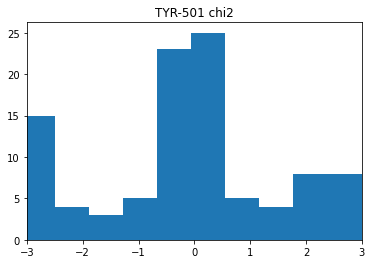

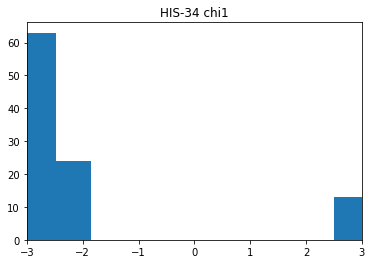

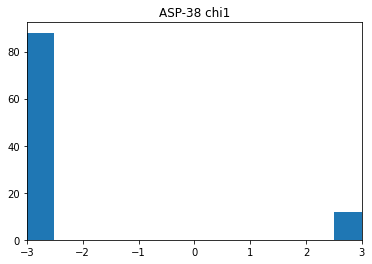

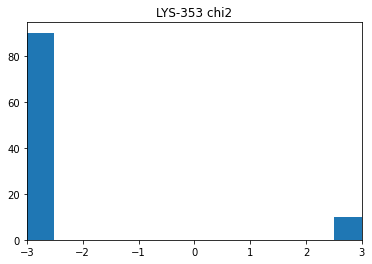

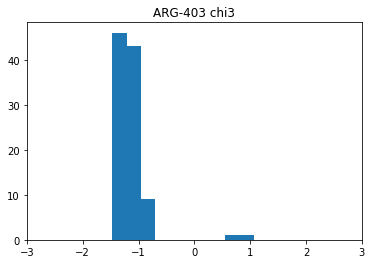

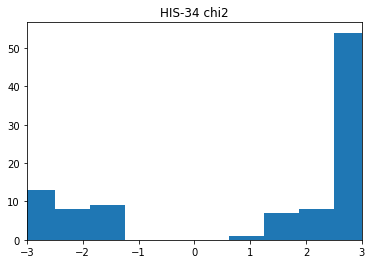

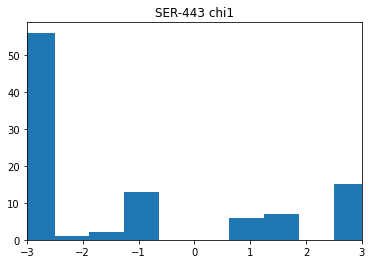

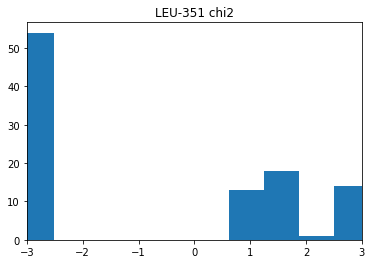

In [152]:
for res_name, angle_name, angle_type, angle_index in pairs:
    plt.hist(angles_neq_all[angle_type][:, angle_index])
    plt.title(f"{res_name} {angle_name}")
    plt.xlim([-3, 3])
    plt.show()

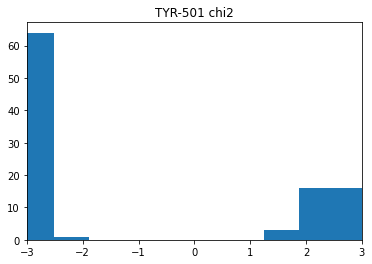

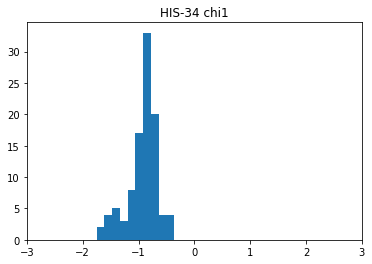

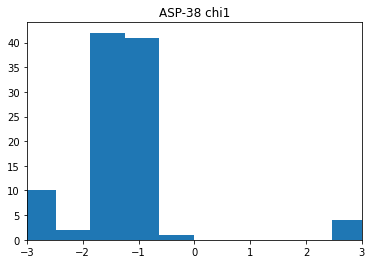

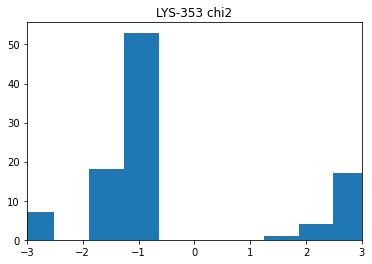

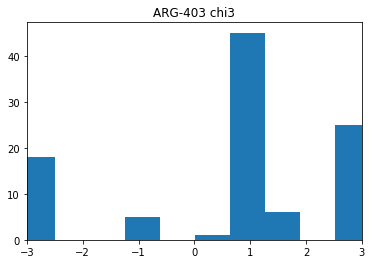

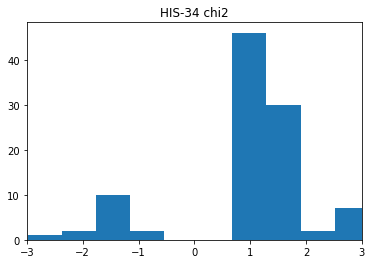

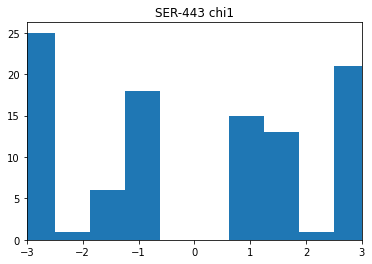

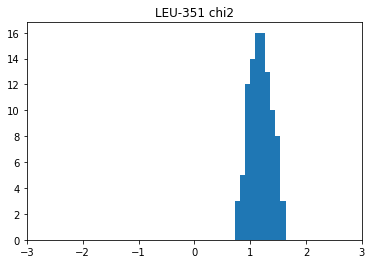

In [153]:
for res_name, angle_name, angle_type, angle_index in pairs:
    plt.hist(angles_rest_all[angle_type][:, angle_index])
    plt.title(f"{res_name} {angle_name}")
    plt.xlim([-3, 3])
    plt.show()

In [140]:
def cluster_V1(angle):
    if angle <= -2 or angle > 2:
        return -3
    elif angle > -2 and angle < 0:
        return -1
    else:
        return 1

def cluster_V2(angle):
    if angle <= -1.5 or angle > 1.5:
        return -3
    else:
        return 0

In [154]:
d_clusters_neq_all = {}
d_clusters_rest_all = {}
for res_name, angle_name, angle_type, angle_index in pairs:
    
    cluster = cluster_V2 if res_name == 'TYR-501' else cluster_V1
    
    d_clusters_neq = {-3: [], -1: [], 0: [], 1: []}
    for i, angle in enumerate(angles_neq_all[angle_type][:, angle_index]):
        d_clusters_neq[cluster(angle)].append(i)
    d_clusters_neq_all[(res_name, angle_name)] = d_clusters_neq

    d_clusters_rest = {-3: [], -1: [], 0: [], 1: []}
    for i, angle in enumerate(angles_rest_all[angle_type][:, angle_index]):
        d_clusters_rest[cluster(angle)].append(i)
    d_clusters_rest_all[(res_name, angle_name)] = d_clusters_rest

## Plot the work values for each cluster

In [132]:
from perses.analysis.analysis import Analysis
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pymbar
%matplotlib inline
import os
import itertools
from tqdm import tqdm_notebook
import pandas as pd
import tqdm
import warnings
warnings.filterwarnings('ignore')
from simtk.openmm import unit
from openmmtools.constants import kB
KT_KCALMOL = kB * 300 * unit.kelvin / unit.kilocalories_per_mole
import pandas as pd
import pickle

INFO:numexpr.utils:Note: detected 80 virtual cores but NumExpr set to maximum of 64, check "NUMEXPR_MAX_THREADS" environment variable.
INFO:numexpr.utils:Note: NumExpr detected 80 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.


In [133]:
def analyze(forward_accumulated, reverse_accumulated): 
    # Compute dg, ddg
    dg, ddg = pymbar.bar.BAR(forward_accumulated, reverse_accumulated)
    return dg, ddg



In [134]:
# Load data into dicts and plot 
titles = ["A501Y"]
phases = ['complex', 'apo']
directions = ['forward', 'reverse']
d_input = {}
dir_num = 15
forward = 83
for i in tqdm_notebook([forward]):
    print(f"dir: {i}")
    d_works = {"complex": {}, "apo":{}}
    d_combined_works = {"complex": {}, "apo":{}}
    for phase in phases:
        for direction in directions:
            all_arrays = []
            for j in range(100):
                print(f"job: {j}")
                path = f"/data/chodera/zhangi/perses_benchmark/neq/{dir_num}/{i}/{i}_{phase}_{j}_{direction}.npy"
                try:
                    if os.path.exists(path):
                        with open(path, 'rb') as f:
                            array = np.load(f)
                            if not np.isnan(np.sum(array)):
                                all_arrays.append(array)
                except:
                    continue
            print(len(all_arrays))
            if all_arrays:
                combined = np.concatenate(all_arrays)
                accumulated = np.array([cycle[-1] - cycle[0] for cycle in combined])
#                 combined = np.array([cycle[0::100] for cycle in combined])
                d_combined_works[phase][direction] = combined
                d_works[phase][direction] = accumulated
    
    d_input[i] = d_works
    
    # Plot
    complex_dg, complex_ddg = analyze(d_works['complex']['forward'], d_works['complex']['reverse'])
#     apo_dg, apo_ddg = analyze(d_works['apo']['forward'], d_works['apo']['reverse'])
#     plot(d_combined_works['complex']['forward'], d_combined_works['complex']['reverse'], complex_dg, complex_ddg, i, 'complex', os.path.dirname(path), titles[i-forward])
#     plot(d_combined_works['apo']['forward'], d_combined_works['apo']['reverse'], apo_dg, apo_ddg, i, 'apo', os.path.dirname(path), titles[i-forward])
        

  0%|          | 0/1 [00:00<?, ?it/s]

dir: 83
job: 0
job: 1
job: 2
job: 3
job: 4
job: 5
job: 6
job: 7
job: 8
job: 9
job: 10
job: 11
job: 12
job: 13
job: 14
job: 15
job: 16
job: 17
job: 18
job: 19
job: 20
job: 21
job: 22
job: 23
job: 24
job: 25
job: 26
job: 27
job: 28
job: 29
job: 30
job: 31
job: 32
job: 33
job: 34
job: 35
job: 36
job: 37
job: 38
job: 39
job: 40
job: 41
job: 42
job: 43
job: 44
job: 45
job: 46
job: 47
job: 48
job: 49
job: 50
job: 51
job: 52
job: 53
job: 54
job: 55
job: 56
job: 57
job: 58
job: 59
job: 60
job: 61
job: 62
job: 63
job: 64
job: 65
job: 66
job: 67
job: 68
job: 69
job: 70
job: 71
job: 72
job: 73
job: 74
job: 75
job: 76
job: 77
job: 78
job: 79
job: 80
job: 81
job: 82
job: 83
job: 84
job: 85
job: 86
job: 87
job: 88
job: 89
job: 90
job: 91
job: 92
job: 93
job: 94
job: 95
job: 96
job: 97
job: 98
job: 99
100
job: 0
job: 1
job: 2
job: 3
job: 4
job: 5
job: 6
job: 7
job: 8
job: 9
job: 10
job: 11
job: 12
job: 13
job: 14
job: 15
job: 16
job: 17
job: 18
job: 19
job: 20
job: 21
job: 22
job: 23
job: 24
job: 25


In [168]:
# Check if forward and reverse work pairs differ by > 10 kT
for i, (forward_work, reverse_work) in enumerate(zip(d_works['complex']['forward'], d_works['complex']['reverse'])):
    if abs(forward_work - reverse_work*-1) < 10:
        print(i, forward_work, reverse_work)

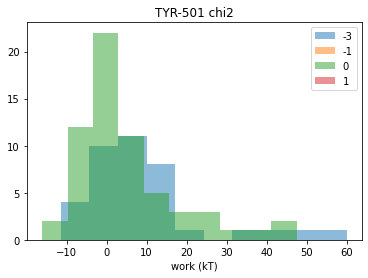

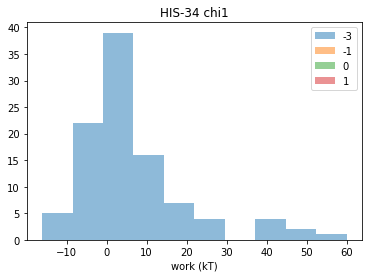

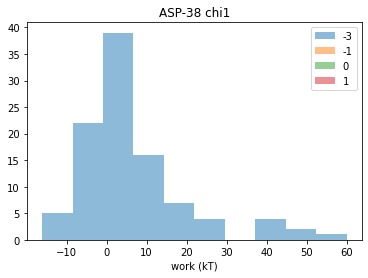

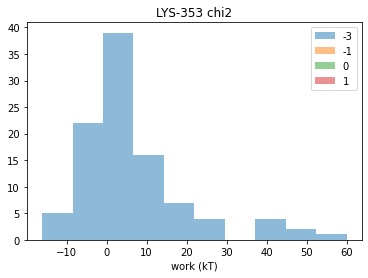

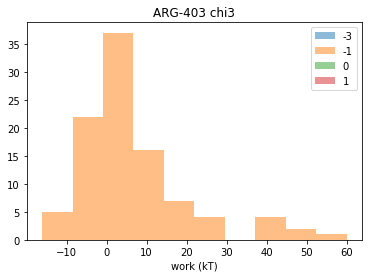

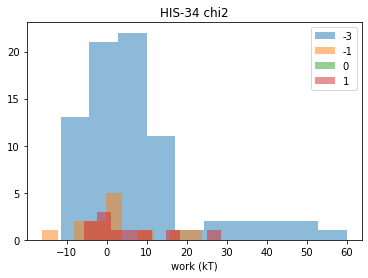

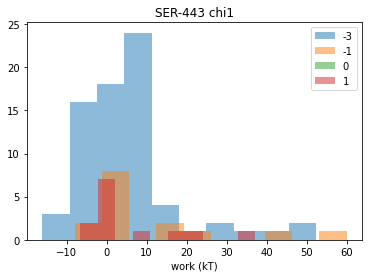

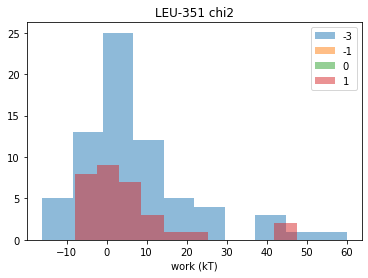

In [156]:
for res_name, angle_name, angle_type, angle_index in pairs:
    for k, v in d_clusters_neq_all[(res_name, angle_name)].items():
        plt.hist(d_works['complex']['forward'][v], alpha=0.5, label=k)
    plt.xlabel("work (kT)")
    plt.title(f"{res_name} {angle_name}")
    plt.legend()
    plt.show()

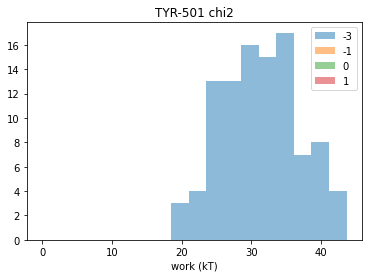

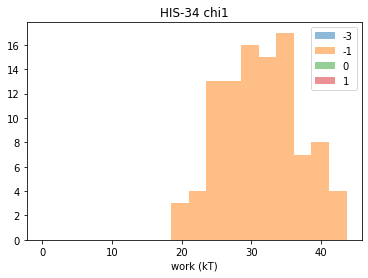

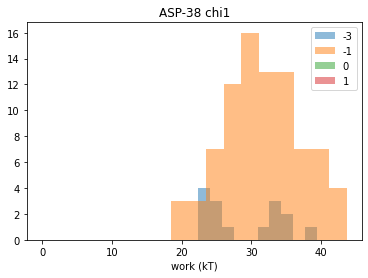

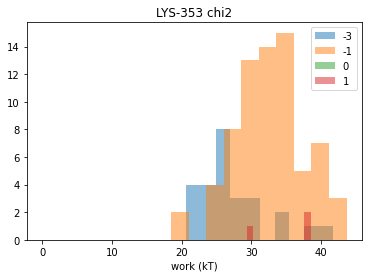

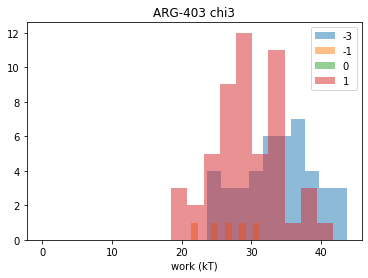

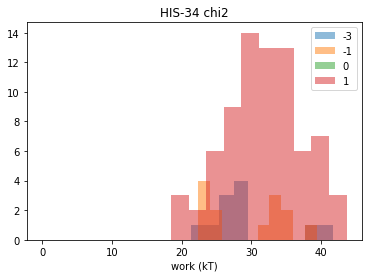

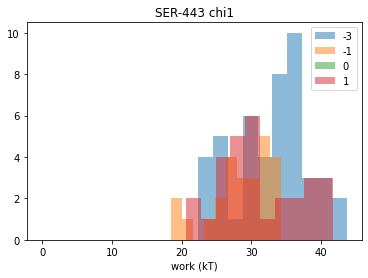

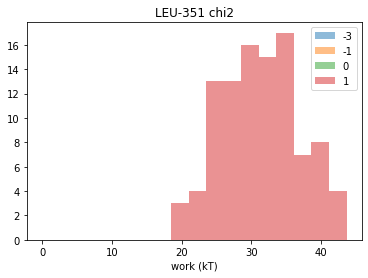

In [157]:
for res_name, angle_name, angle_type, angle_index in pairs:
    for k, v in d_clusters_rest_all[(res_name, angle_name)].items():
        plt.hist(d_works['complex']['reverse'][v], alpha=0.5, label=k)
    plt.xlabel("work (kT)")
    plt.title(f"{res_name} {angle_name}")
    plt.legend()
    plt.show()

## Check number of waters within 5 angstroms of N501Y

Y501

In [8]:
name = "tyr"
endstate = 1
is_old = False
traj_rest_solvent = make_traj(outdir_rest, htf, i, phase, name, endstate, is_old, keep_solvent=True)

<ipython-input-6-45ff68d441e7>:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for j, pos in tqdm_notebook(enumerate(cache)):


0it [00:00, ?it/s]

ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


In [9]:
tyr_atoms = []
for atom in traj_rest_solvent.topology.atoms:
    if atom.residue.resSeq == 501 and atom.residue.name == 'TYR':
        print(atom, atom.residue.resSeq, atom.index)
        tyr_atoms.append(atom.index)

TYR501-N 501 2605
TYR501-H 501 2606
TYR501-CA 501 2607
TYR501-HA 501 2608
TYR501-CB 501 2609
TYR501-HB2 501 2610
TYR501-HB3 501 2611
TYR501-CG 501 2612
TYR501-CD1 501 2613
TYR501-HD1 501 2614
TYR501-CE1 501 2615
TYR501-HE1 501 2616
TYR501-CZ 501 2617
TYR501-OH 501 2618
TYR501-HH 501 2619
TYR501-CE2 501 2620
TYR501-HE2 501 2621
TYR501-CD2 501 2622
TYR501-HD2 501 2623
TYR501-C 501 2624
TYR501-O 501 2625


In [10]:
water_atoms = traj_rest_solvent.topology.select("water and symbol == 'O'")

In [11]:
neighbors = md.compute_neighbors(traj_rest_solvent, 0.5, tyr_atoms, haystack_indices=water_atoms)

<ipython-input-11-a5abb6fa0691>:1: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  neighbors = md.compute_neighbors(traj_rest_solvent, 0.5, tyr_atoms, haystack_indices=water_atoms)


Text(0.5, 1.0, 'Y501')

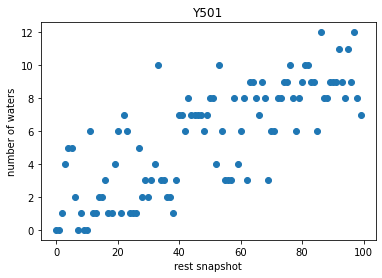

In [14]:
plt.scatter(range(len(neighbors)), [len(frame) for frame in neighbors])
plt.ylabel("number of waters")
plt.xlabel("rest snapshot")
plt.title("Y501")

A501

In [15]:
name = "ala"
endstate = 0
is_old = True
traj_rest_solvent_old = make_traj(outdir_rest, htf, i, phase, name, endstate, is_old, keep_solvent=True)

<ipython-input-6-45ff68d441e7>:16: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for j, pos in tqdm_notebook(enumerate(cache)):


0it [00:00, ?it/s]

ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


In [16]:
ala_atoms = []
for atom in traj_rest_solvent_old.topology.atoms:
    if atom.residue.resSeq == 501 and atom.residue.name == 'ALA':
        print(atom, atom.residue.resSeq, atom.index)
        ala_atoms.append(atom.index)

ALA501-N 501 2605
ALA501-H 501 2606
ALA501-CA 501 2607
ALA501-HA 501 2608
ALA501-CB 501 2609
ALA501-HB1 501 2610
ALA501-HB2 501 2611
ALA501-HB3 501 2612
ALA501-C 501 2613
ALA501-O 501 2614
ALA501-N 501 10898
ALA501-H 501 10899
ALA501-CA 501 10900
ALA501-HA 501 10901
ALA501-CB 501 10902
ALA501-HB1 501 10903
ALA501-HB2 501 10904
ALA501-HB3 501 10905
ALA501-C 501 10906
ALA501-O 501 10907


In [17]:
water_atoms = traj_rest_solvent_old.topology.select("water and symbol == 'O'")

In [18]:
neighbors = md.compute_neighbors(traj_rest_solvent_old, 0.5, ala_atoms, haystack_indices=water_atoms)

<ipython-input-18-748c5a634a00>:1: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  neighbors = md.compute_neighbors(traj_rest_solvent_old, 0.5, ala_atoms, haystack_indices=water_atoms)


(0.0, 12.0)

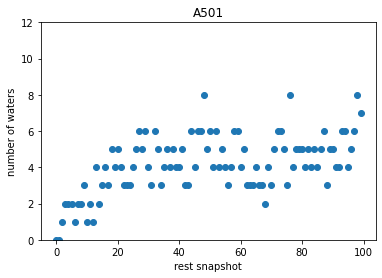

In [20]:
plt.scatter(range(len(neighbors)), [len(frame) for frame in neighbors])
plt.ylabel("number of waters")
plt.xlabel("rest snapshot")
plt.title("A501")
plt.ylim([0, 12])

## Check for hbonds to RBD/ACE2

In [10]:
name = "ala"
endstate = 0
is_old = True
traj_rest_solvent_old = make_traj(outdir_rest, htf, i, phase, name, endstate, is_old, keep_solvent=True)

<ipython-input-9-45ff68d441e7>:16: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for j, pos in tqdm_notebook(enumerate(cache)):


0it [00:00, ?it/s]

ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


In [30]:
traj_rest_solvent_old.save("traj_rest_solvent_old.dcd")
traj_rest_solvent_old[0].save("traj_rest_solvent_old.pdb")

Note: use ala code cells to determine hbonds in old traj, use tyr code cells to determine hbonds in new traj

In [79]:
ala_atoms = []
for atom in traj_rest_solvent_old.topology.atoms:
    if atom.residue.resSeq == 501 and atom.residue.name == 'ALA':
        print(atom, atom.residue.resSeq, atom.index)
        ala_atoms.append(atom.index)

ALA501-N 501 2605
ALA501-H 501 2606
ALA501-CA 501 2607
ALA501-HA 501 2608
ALA501-CB 501 2609
ALA501-HB1 501 2610
ALA501-HB2 501 2611
ALA501-HB3 501 2612
ALA501-C 501 2613
ALA501-O 501 2614
ALA501-N 501 10898
ALA501-H 501 10899
ALA501-CA 501 10900
ALA501-HA 501 10901
ALA501-CB 501 10902
ALA501-HB1 501 10903
ALA501-HB2 501 10904
ALA501-HB3 501 10905
ALA501-C 501 10906
ALA501-O 501 10907


In [80]:
water_atoms = traj_rest_solvent_old.topology.select("water")
neighbors = md.compute_neighbors(traj_rest_solvent_old, 0.5, ala_atoms, haystack_indices=water_atoms)

<ipython-input-80-5099f9882999>:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  neighbors = md.compute_neighbors(traj_rest_solvent_old, 0.5, ala_atoms, haystack_indices=water_atoms)


In [81]:
neighbors_atoms = [atom for frame in neighbors for atom in frame]

In [82]:
protein_atoms = traj_rest_solvent_old.topology.select("protein")

In [83]:
tyr_atoms = []
for atom in traj_rest_solvent_new.topology.atoms:
    if atom.residue.resSeq == 501 and atom.residue.name == 'TYR':
        print(atom, atom.residue.resSeq, atom.index)
        tyr_atoms.append(atom.index)

TYR501-N 501 2605
TYR501-H 501 2606
TYR501-CA 501 2607
TYR501-HA 501 2608
TYR501-CB 501 2609
TYR501-HB2 501 2610
TYR501-HB3 501 2611
TYR501-CG 501 2612
TYR501-CD1 501 2613
TYR501-HD1 501 2614
TYR501-CE1 501 2615
TYR501-HE1 501 2616
TYR501-CZ 501 2617
TYR501-OH 501 2618
TYR501-HH 501 2619
TYR501-CE2 501 2620
TYR501-HE2 501 2621
TYR501-CD2 501 2622
TYR501-HD2 501 2623
TYR501-C 501 2624
TYR501-O 501 2625


In [71]:
water_atoms = traj_rest_solvent_old.topology.select("water")
neighbors = md.compute_neighbors(traj_rest_solvent_new, 0.5, tyr_atoms, haystack_indices=water_atoms)

<ipython-input-71-9a45a19c6ae6>:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  neighbors = md.compute_neighbors(traj_rest_solvent_new, 0.5, tyr_atoms, haystack_indices=water_atoms)


In [72]:
neighbors_atoms = [atom for frame in neighbors for atom in frame]

In [73]:
protein_atoms = traj_rest_solvent_new.topology.select("protein")

In [84]:
from __future__ import print_function, division
import numpy as np
from mdtraj.utils import ensure_type
from mdtraj.geometry import compute_distances, compute_angles
from mdtraj.geometry import _geometry

def baker_hubbard(traj, freq=0.1, exclude_water=True, periodic=True, sidechain_only=False,
                  distance_cutoff=0.25, angle_cutoff=120):
    """Identify hydrogen bonds based on cutoffs for the Donor-H...Acceptor
    distance and angle.
    The criterion employed is :math:`\\theta > 120` and
    :math:`r_\\text{H...Acceptor} < 2.5 A`.
    When donor the donor is 'N' and the acceptor is 'O', this corresponds to
    the definition established in [1]_. The donors considered by this method
    are NH and OH, and the acceptors considered are O and N.
    Parameters
    ----------
    traj : md.Trajectory
        An mdtraj trajectory. It must contain topology information.
    freq : float, default=0.1
        Return only hydrogen bonds that occur in greater this fraction of the
        frames in the trajectory.
    exclude_water : bool, default=True
        Exclude solvent molecules from consideration
    periodic : bool, default=True
        Set to True to calculate displacements and angles across periodic box boundaries.
    sidechain_only : bool, default=False
        Set to True to only consider sidechain-sidechain interactions.
    distance_cutoff : float, default=0.25
        Distance cutoff of Donor-H...Acceptor contact in nanometers. 
        The criterion employed is any contact that is shorter than the distance cutoff.
        with an distance_cutoff is accepted.
    angle_cutoff : float, default=120
        Angle cutoff of the angle theta in degrees. 
        The criterion employed is any contact with an angle theta greater than the
        angle_cutoff is accepted.
    Returns
    -------
    hbonds : np.array, shape=[n_hbonds, 3], dtype=int
        An array containing the indices atoms involved in each of the identified
        hydrogen bonds. Each row contains three integer indices, `(d_i, h_i,
        a_i)`, such that `d_i` is the index of the donor atom, `h_i` the index
        of the hydrogen atom, and `a_i` the index of the acceptor atom involved
        in a hydrogen bond which occurs (according to the definition above) in
        proportion greater than `freq` of the trajectory.
    Notes
    -----
    Each hydrogen bond is distinguished for the purpose of this function by the
    indices of the donor, hydrogen, and acceptor atoms. This means that, for
    example, when an ARG sidechain makes a hydrogen bond with its NH2 group,
    you might see what appear like double counting of the h-bonds, since the
    hydrogen bond formed via the H_1 and H_2 are counted separately, despite
    their "chemical indistinguishably"
    Examples
    --------
    >>> md.baker_hubbard(t)
    array([[  0,  10,   8],
           [  0,  11,   7],
           [ 69,  73,  54],
           [ 76,  82,  65],
           [119, 131,  89],
           [140, 148, 265],
           [166, 177, 122],
           [181, 188, 231]])
    >>> label = lambda hbond : '%s -- %s' % (t.topology.atom(hbond[0]), t.topology.atom(hbond[2]))
    >>> for hbond in hbonds:
    >>>     print label(hbond)
    GLU1-N -- GLU1-OE2
    GLU1-N -- GLU1-OE1
    GLY6-N -- SER4-O
    CYS7-N -- GLY5-O
    TYR11-N -- VAL8-O
    MET12-N -- LYS20-O
    See Also
    --------
    kabsch_sander
    References
    ----------
    .. [1] Baker, E. N., and R. E. Hubbard. "Hydrogen bonding in globular
        proteins." Progress in Biophysics and Molecular Biology
        44.2 (1984): 97-179.
    """
    angle_cutoff = np.radians(angle_cutoff)

    if traj.topology is None:
        raise ValueError('baker_hubbard requires that traj contain topology '
                         'information')

    # Get the possible donor-hydrogen...acceptor triplets
    bond_triplets = _get_bond_triplets(traj.topology,
        exclude_water=exclude_water, sidechain_only=sidechain_only)

    mask, distances, angles = _compute_bounded_geometry(traj, bond_triplets,
        distance_cutoff, [1, 2], [0, 1, 2], freq=freq, periodic=periodic)
    
    # Find triplets that meet the criteria
    presence = np.logical_and(distances < distance_cutoff, angles > angle_cutoff)
    mask[mask] = np.mean(presence, axis=0) > freq

    return bond_triplets.compress(mask, axis=0)

def _get_bond_triplets(topology, exclude_water=True, sidechain_only=False):
    def can_participate(atom):
        # Filter waters
        if atom.index in neighbors_atoms or atom.index in protein_atoms:
            return True
        else:
            return False

    def get_donors(e0, e1):
        # Find all matching bonds
        elems = set((e0, e1))
        atoms = [(one, two) for one, two in topology.bonds
            if set((one.element.symbol, two.element.symbol)) == elems]

        # Filter non-participating atoms
        atoms = [atom for atom in atoms
            if can_participate(atom[0]) and can_participate(atom[1])]

        # Get indices for the remaining atoms
        indices = []
        for a0, a1 in atoms:
            pair = (a0.index, a1.index)
            # make sure to get the pair in the right order, so that the index
            # for e0 comes before e1
            if a0.element.symbol == e1:
                pair = pair[::-1]
            indices.append(pair)

        return indices

    # Check that there are bonds in topology
    nbonds = 0
    for _bond in topology.bonds:
        nbonds += 1
        break # Only need to find one hit for this check (not robust)
    if nbonds == 0:
        raise ValueError('No bonds found in topology. Try using '
                         'traj._topology.create_standard_bonds() to create bonds '
                         'using our PDB standard bond definitions.')
        
    nh_donors = get_donors('N', 'H')
    oh_donors = get_donors('O', 'H')
    xh_donors = np.array(nh_donors + oh_donors)

    if len(xh_donors) == 0:
        # if there are no hydrogens or protein in the trajectory, we get
        # no possible pairs and return nothing
        return np.zeros((0, 3), dtype=int)

    acceptor_elements = frozenset(('O', 'N'))
    acceptors = [a.index for a in topology.atoms
        if a.element.symbol in acceptor_elements and can_participate(a)]

    # Make acceptors a 2-D numpy array
    acceptors = np.array(acceptors)[:, np.newaxis]

    # Generate the cartesian product of the donors and acceptors
    xh_donors_repeated = np.repeat(xh_donors, acceptors.shape[0], axis=0)
    acceptors_tiled = np.tile(acceptors, (xh_donors.shape[0], 1))
    bond_triplets = np.hstack((xh_donors_repeated, acceptors_tiled))

    # Filter out self-bonds
    self_bond_mask = (bond_triplets[:, 0] == bond_triplets[:, 2])
    return bond_triplets[np.logical_not(self_bond_mask), :]


def _compute_bounded_geometry(traj, triplets, distance_cutoff, distance_indices,
                              angle_indices, freq=0.0, periodic=True):
    """
    Returns a tuple include (1) the mask for triplets that fulfill the distance
    criteria frequently enough, (2) the actual distances calculated, and (3) the
    angles between the triplets specified by angle_indices.
    """
    # First we calculate the requested distances
    distances = compute_distances(traj, triplets[:, distance_indices], periodic=periodic)

    # Now we discover which triplets meet the distance cutoff often enough
    prevalence = np.mean(distances < distance_cutoff, axis=0)
    mask = prevalence > freq

    # Update data structures to ignore anything that isn't possible anymore
    triplets = triplets.compress(mask, axis=0)
    distances = distances.compress(mask, axis=1)

    # Calculate angles using the law of cosines
    abc_pairs = zip(angle_indices, angle_indices[1:] + angle_indices[:1])
    abc_distances = []

    # Calculate distances (if necessary)
    for abc_pair in abc_pairs:
        if set(abc_pair) == set(distance_indices):
            abc_distances.append(distances)
        else:
            abc_distances.append(compute_distances(traj, triplets[:, abc_pair],
                periodic=periodic))

    # Law of cosines calculation
    a, b, c = abc_distances
    cosines = (a ** 2 + b ** 2 - c ** 2) / (2 * a * b)
    np.clip(cosines, -1, 1, out=cosines) # avoid NaN error
    angles = np.arccos(cosines)

    return mask, distances, angles

In [85]:
hbonds_old = baker_hubbard(traj_rest_solvent_old, exclude_water=False)

In [63]:
def filter_hbonds(hbond):
    if (hbond[0] in neighbors_atoms) ^ (hbond[2] in neighbors_atoms): # if one of the atoms is a neighboring water
        return f'chain{traj_rest_solvent_old.topology.atom(hbond[0]).residue.chain.index}-{traj_rest_solvent_old.topology.atom(hbond[0])} -- chain{traj_rest_solvent_old.topology.atom(hbond[2]).residue.chain.index}-{traj_rest_solvent_old.topology.atom(hbond[2])}'

In [86]:
count = 0
for hbond in hbonds_old:
    if filter_hbonds(hbond):
        print(filter_hbonds(hbond))
        count += 1
print(count)

chain0-GLY504-N -- chain5-HOH29374-O
chain0-THR500-N -- chain5-HOH39250-O
chain0-GLN498-NE2 -- chain5-HOH39125-O
chain2-ASN330-ND2 -- chain5-HOH39289-O
chain2-LEU333-N -- chain5-HOH39319-O
chain2-ARG357-NH1 -- chain5-HOH39269-O
chain2-ARG357-NH2 -- chain5-HOH39269-O
chain2-THR324-OG1 -- chain5-HOH29379-O
chain2-THR324-OG1 -- chain5-HOH29382-O
chain2-THR324-OG1 -- chain5-HOH39257-O
chain2-THR324-OG1 -- chain5-HOH39343-O
chain5-HOH29379-O -- chain2-GLY354-O
chain5-HOH29382-O -- chain2-GLY354-O
chain5-HOH39250-O -- chain0-THR500-OG1
chain5-HOH39250-O -- chain2-TYR41-OH
chain5-HOH39250-O -- chain0-THR500-OG1
chain5-HOH39257-O -- chain0-THR500-O
chain5-HOH39257-O -- chain2-THR52-OG1
chain5-HOH39257-O -- chain2-GLY354-O
chain5-HOH39282-O -- chain0-THR500-O
chain5-HOH39289-O -- chain2-ASP355-OD1
chain5-HOH39289-O -- chain2-PHE356-O
chain5-HOH39315-O -- chain2-ASP355-OD1
chain5-HOH39315-O -- chain2-PHE356-O
chain5-HOH39467-O -- chain0-THR500-O
25


In [65]:
name = "tyr"
endstate = 1
is_old = False
traj_rest_solvent_new = make_traj(outdir_rest, htf, i, phase, name, endstate, is_old, keep_solvent=True)

<ipython-input-9-45ff68d441e7>:22: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for j, pos in tqdm_notebook(enumerate(cache)):


0it [00:00, ?it/s]

ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


ValueError: Buffer dtype mismatch, expected 'float' but got 'double'

Exception ignored in: 'mdtraj.geometry._geometry.image_frame'
Traceback (most recent call last):
  File "/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/mdtraj/core/trajectory.py", line 2003, in image_molecules
    _geometry.image_molecules(result.xyz, box, anchor_molecules_atom_indices, other_molecules_atom_indices, sorted_bonds)
ValueError: Buffer dtype mismatch, expected 'float' but got 'double'


In [75]:
hbonds_new = baker_hubbard(traj_rest_solvent_new, exclude_water=False)

In [77]:
count = 0
for hbond in hbonds_new:
    if filter_hbonds(hbond):
        print(filter_hbonds(hbond))
        count += 1
print(count)

chain0-TYR505-CB -- chain5-HOH29389-H2
chain0-VAL503-HG21 -- chain5-HOH20585-H2
chain0-GLN498-NE2 -- chain5-HOH29301-H2
chain0-GLY496-N -- chain5-HOH29357-H2
chain0-ARG403-NE -- chain5-HOH29370-H2
chain0-ARG403-NH1 -- chain5-HOH29349-H2
chain0-ARG403-NH1 -- chain5-HOH29370-H2
chain0-ARG403-NH1 -- chain5-HOH29390-H2
chain0-ARG403-NH1 -- chain5-HOH29461-H2
chain2-SER43-HB3 -- chain5-HOH29301-H2
chain2-GLN325-OE1 -- chain5-HOH39385-H2
chain2-PHE327-CB -- chain5-HOH29380-H2
chain2-SER331-HB3 -- chain5-HOH40795-H2
chain2-SER331-HB3 -- chain5-HOH29383-H2
chain2-GLY354-C -- chain5-HOH29347-H2
chain2-GLY354-C -- chain5-HOH29349-H2
chain2-ILE358-HA -- chain5-HOH39349-H2
chain2-ILE358-CG2 -- chain5-HOH39349-H2
chain2-PHE390-HE1 -- chain5-HOH29390-H2
chain2-ASN394-HB3 -- chain5-HOH29390-H2
chain2-GLN325-CG -- chain5-HOH29387-H2
chain5-HOH29301-H2 -- chain2-LEU39-HD11
chain5-HOH29347-H2 -- chain2-GLU35-CD
chain5-HOH29349-H2 -- chain0-GLY496-O
chain5-HOH29349-H2 -- chain0-LEU492-O
chain5-HOH29357-H

## Tried hbond analysis per frame using mdnalysis

In [39]:
import MDAnalysis as mda
from MDAnalysis.analysis.hydrogenbonds.hbond_analysis import HydrogenBondAnalysis as HBA

In [34]:
u = mda.Universe("traj_rest_solvent_old.pdb", "traj_rest_solvent_old.dcd")

/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/MDAnalysis/topology/base.py:203: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  residx = np.zeros_like(criteria[0], dtype=np.int)
/home/zhangi/miniconda3/envs/perses-rbd-ace2/lib/python3.8/site-packages/MDAnalysis/topology/PDBParser.py:426: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `n

In [35]:
u

<Universe with 183493 atoms>

In [45]:
for atom in u.atoms:
    print(atom)

<Atom 1: H1 of type H of resname ACE, resid 332 and segid A and altLoc >
<Atom 2: CH3 of type C of resname ACE, resid 332 and segid A and altLoc >
<Atom 3: H2 of type H of resname ACE, resid 332 and segid A and altLoc >
<Atom 4: H3 of type H of resname ACE, resid 332 and segid A and altLoc >
<Atom 5: C of type C of resname ACE, resid 332 and segid A and altLoc >
<Atom 6: O of type O of resname ACE, resid 332 and segid A and altLoc >
<Atom 7: N of type N of resname THR, resid 333 and segid A and altLoc >
<Atom 8: H of type H of resname THR, resid 333 and segid A and altLoc >
<Atom 9: CA of type C of resname THR, resid 333 and segid A and altLoc >
<Atom 10: HA of type H of resname THR, resid 333 and segid A and altLoc >
<Atom 11: CB of type C of resname THR, resid 333 and segid A and altLoc >
<Atom 12: HB of type H of resname THR, resid 333 and segid A and altLoc >
<Atom 13: CG2 of type C of resname THR, resid 333 and segid A and altLoc >
<Atom 14: HG21 of type H of resname THR, resid 33

<Atom 4509: NE2 of type N of resname GLN, resid 98 and segid C and altLoc >
<Atom 4510: HE21 of type H of resname GLN, resid 98 and segid C and altLoc >
<Atom 4511: HE22 of type H of resname GLN, resid 98 and segid C and altLoc >
<Atom 4512: C of type C of resname GLN, resid 98 and segid C and altLoc >
<Atom 4513: O of type O of resname GLN, resid 98 and segid C and altLoc >
<Atom 4514: N of type N of resname ALA, resid 99 and segid C and altLoc >
<Atom 4515: H of type H of resname ALA, resid 99 and segid C and altLoc >
<Atom 4516: CA of type C of resname ALA, resid 99 and segid C and altLoc >
<Atom 4517: HA of type H of resname ALA, resid 99 and segid C and altLoc >
<Atom 4518: CB of type C of resname ALA, resid 99 and segid C and altLoc >
<Atom 4519: HB1 of type H of resname ALA, resid 99 and segid C and altLoc >
<Atom 4520: HB2 of type H of resname ALA, resid 99 and segid C and altLoc >
<Atom 4521: HB3 of type H of resname ALA, resid 99 and segid C and altLoc >
<Atom 4522: C of type

<Atom 9508: H of type H of resname LEU, resid 418 and segid C and altLoc >
<Atom 9509: CA of type C of resname LEU, resid 418 and segid C and altLoc >
<Atom 9510: HA of type H of resname LEU, resid 418 and segid C and altLoc >
<Atom 9511: CB of type C of resname LEU, resid 418 and segid C and altLoc >
<Atom 9512: HB2 of type H of resname LEU, resid 418 and segid C and altLoc >
<Atom 9513: HB3 of type H of resname LEU, resid 418 and segid C and altLoc >
<Atom 9514: CG of type C of resname LEU, resid 418 and segid C and altLoc >
<Atom 9515: HG of type H of resname LEU, resid 418 and segid C and altLoc >
<Atom 9516: CD1 of type C of resname LEU, resid 418 and segid C and altLoc >
<Atom 9517: HD11 of type H of resname LEU, resid 418 and segid C and altLoc >
<Atom 9518: HD12 of type H of resname LEU, resid 418 and segid C and altLoc >
<Atom 9519: HD13 of type H of resname LEU, resid 418 and segid C and altLoc >
<Atom 9520: CD2 of type C of resname LEU, resid 418 and segid C and altLoc >
<At

<Atom 14508: HB2 of type H of resname LEU, resid 722 and segid C and altLoc >
<Atom 14509: HB3 of type H of resname LEU, resid 722 and segid C and altLoc >
<Atom 14510: CG of type C of resname LEU, resid 722 and segid C and altLoc >
<Atom 14511: HG of type H of resname LEU, resid 722 and segid C and altLoc >
<Atom 14512: CD1 of type C of resname LEU, resid 722 and segid C and altLoc >
<Atom 14513: HD11 of type H of resname LEU, resid 722 and segid C and altLoc >
<Atom 14514: HD12 of type H of resname LEU, resid 722 and segid C and altLoc >
<Atom 14515: HD13 of type H of resname LEU, resid 722 and segid C and altLoc >
<Atom 14516: CD2 of type C of resname LEU, resid 722 and segid C and altLoc >
<Atom 14517: HD21 of type H of resname LEU, resid 722 and segid C and altLoc >
<Atom 14518: HD22 of type H of resname LEU, resid 722 and segid C and altLoc >
<Atom 14519: HD23 of type H of resname LEU, resid 722 and segid C and altLoc >
<Atom 14520: C of type C of resname LEU, resid 722 and segid

<Atom 19507: H2 of type H of resname HOH, resid 2370 and segid F and altLoc >
<Atom 19508: O of type O of resname HOH, resid 2371 and segid F and altLoc >
<Atom 19509: H1 of type H of resname HOH, resid 2371 and segid F and altLoc >
<Atom 19510: H2 of type H of resname HOH, resid 2371 and segid F and altLoc >
<Atom 19511: O of type O of resname HOH, resid 2372 and segid F and altLoc >
<Atom 19512: H1 of type H of resname HOH, resid 2372 and segid F and altLoc >
<Atom 19513: H2 of type H of resname HOH, resid 2372 and segid F and altLoc >
<Atom 19514: O of type O of resname HOH, resid 2373 and segid F and altLoc >
<Atom 19515: H1 of type H of resname HOH, resid 2373 and segid F and altLoc >
<Atom 19516: H2 of type H of resname HOH, resid 2373 and segid F and altLoc >
<Atom 19517: O of type O of resname HOH, resid 2374 and segid F and altLoc >
<Atom 19518: H1 of type H of resname HOH, resid 2374 and segid F and altLoc >
<Atom 19519: H2 of type H of resname HOH, resid 2374 and segid F and

<Atom 24507: H1 of type H of resname HOH, resid 4037 and segid F and altLoc >
<Atom 24508: H2 of type H of resname HOH, resid 4037 and segid F and altLoc >
<Atom 24509: O of type O of resname HOH, resid 4038 and segid F and altLoc >
<Atom 24510: H1 of type H of resname HOH, resid 4038 and segid F and altLoc >
<Atom 24511: H2 of type H of resname HOH, resid 4038 and segid F and altLoc >
<Atom 24512: O of type O of resname HOH, resid 4039 and segid F and altLoc >
<Atom 24513: H1 of type H of resname HOH, resid 4039 and segid F and altLoc >
<Atom 24514: H2 of type H of resname HOH, resid 4039 and segid F and altLoc >
<Atom 24515: O of type O of resname HOH, resid 4040 and segid F and altLoc >
<Atom 24516: H1 of type H of resname HOH, resid 4040 and segid F and altLoc >
<Atom 24517: H2 of type H of resname HOH, resid 4040 and segid F and altLoc >
<Atom 24518: O of type O of resname HOH, resid 4041 and segid F and altLoc >
<Atom 24519: H1 of type H of resname HOH, resid 4041 and segid F and

<Atom 29506: H2 of type H of resname HOH, resid 5703 and segid F and altLoc >
<Atom 29507: O of type O of resname HOH, resid 5704 and segid F and altLoc >
<Atom 29508: H1 of type H of resname HOH, resid 5704 and segid F and altLoc >
<Atom 29509: H2 of type H of resname HOH, resid 5704 and segid F and altLoc >
<Atom 29510: O of type O of resname HOH, resid 5705 and segid F and altLoc >
<Atom 29511: H1 of type H of resname HOH, resid 5705 and segid F and altLoc >
<Atom 29512: H2 of type H of resname HOH, resid 5705 and segid F and altLoc >
<Atom 29513: O of type O of resname HOH, resid 5706 and segid F and altLoc >
<Atom 29514: H1 of type H of resname HOH, resid 5706 and segid F and altLoc >
<Atom 29515: H2 of type H of resname HOH, resid 5706 and segid F and altLoc >
<Atom 29516: O of type O of resname HOH, resid 5707 and segid F and altLoc >
<Atom 29517: H1 of type H of resname HOH, resid 5707 and segid F and altLoc >
<Atom 29518: H2 of type H of resname HOH, resid 5707 and segid F and

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




<Atom 82002: H1 of type H of resname HOH, resid 23202 and segid F and altLoc >
<Atom 82003: H2 of type H of resname HOH, resid 23202 and segid F and altLoc >
<Atom 82004: O of type O of resname HOH, resid 23203 and segid F and altLoc >
<Atom 82005: H1 of type H of resname HOH, resid 23203 and segid F and altLoc >
<Atom 82006: H2 of type H of resname HOH, resid 23203 and segid F and altLoc >
<Atom 82007: O of type O of resname HOH, resid 23204 and segid F and altLoc >
<Atom 82008: H1 of type H of resname HOH, resid 23204 and segid F and altLoc >
<Atom 82009: H2 of type H of resname HOH, resid 23204 and segid F and altLoc >
<Atom 82010: O of type O of resname HOH, resid 23205 and segid F and altLoc >
<Atom 82011: H1 of type H of resname HOH, resid 23205 and segid F and altLoc >
<Atom 82012: H2 of type H of resname HOH, resid 23205 and segid F and altLoc >
<Atom 82013: O of type O of resname HOH, resid 23206 and segid F and altLoc >
<Atom 82014: H1 of type H of resname HOH, resid 23206 a

<Atom 87501: H1 of type H of resname HOH, resid 25035 and segid F and altLoc >
<Atom 87502: H2 of type H of resname HOH, resid 25035 and segid F and altLoc >
<Atom 87503: O of type O of resname HOH, resid 25036 and segid F and altLoc >
<Atom 87504: H1 of type H of resname HOH, resid 25036 and segid F and altLoc >
<Atom 87505: H2 of type H of resname HOH, resid 25036 and segid F and altLoc >
<Atom 87506: O of type O of resname HOH, resid 25037 and segid F and altLoc >
<Atom 87507: H1 of type H of resname HOH, resid 25037 and segid F and altLoc >
<Atom 87508: H2 of type H of resname HOH, resid 25037 and segid F and altLoc >
<Atom 87509: O of type O of resname HOH, resid 25038 and segid F and altLoc >
<Atom 87510: H1 of type H of resname HOH, resid 25038 and segid F and altLoc >
<Atom 87511: H2 of type H of resname HOH, resid 25038 and segid F and altLoc >
<Atom 87512: O of type O of resname HOH, resid 25039 and segid F and altLoc >
<Atom 87513: H1 of type H of resname HOH, resid 25039 an

<Atom 92500: H2 of type H of resname HOH, resid 26701 and segid F and altLoc >
<Atom 92501: O of type O of resname HOH, resid 26702 and segid F and altLoc >
<Atom 92502: H1 of type H of resname HOH, resid 26702 and segid F and altLoc >
<Atom 92503: H2 of type H of resname HOH, resid 26702 and segid F and altLoc >
<Atom 92504: O of type O of resname HOH, resid 26703 and segid F and altLoc >
<Atom 92505: H1 of type H of resname HOH, resid 26703 and segid F and altLoc >
<Atom 92506: H2 of type H of resname HOH, resid 26703 and segid F and altLoc >
<Atom 92507: O of type O of resname HOH, resid 26704 and segid F and altLoc >
<Atom 92508: H1 of type H of resname HOH, resid 26704 and segid F and altLoc >
<Atom 92509: H2 of type H of resname HOH, resid 26704 and segid F and altLoc >
<Atom 92510: O of type O of resname HOH, resid 26705 and segid F and altLoc >
<Atom 92511: H1 of type H of resname HOH, resid 26705 and segid F and altLoc >
<Atom 92512: H2 of type H of resname HOH, resid 26705 an

<Atom 97500: H1 of type H of resname HOH, resid 28368 and segid F and altLoc >
<Atom 97501: H2 of type H of resname HOH, resid 28368 and segid F and altLoc >
<Atom 97502: O of type O of resname HOH, resid 28369 and segid F and altLoc >
<Atom 97503: H1 of type H of resname HOH, resid 28369 and segid F and altLoc >
<Atom 97504: H2 of type H of resname HOH, resid 28369 and segid F and altLoc >
<Atom 97505: O of type O of resname HOH, resid 28370 and segid F and altLoc >
<Atom 97506: H1 of type H of resname HOH, resid 28370 and segid F and altLoc >
<Atom 97507: H2 of type H of resname HOH, resid 28370 and segid F and altLoc >
<Atom 97508: O of type O of resname HOH, resid 28371 and segid F and altLoc >
<Atom 97509: H1 of type H of resname HOH, resid 28371 and segid F and altLoc >
<Atom 97510: H2 of type H of resname HOH, resid 28371 and segid F and altLoc >
<Atom 97511: O of type O of resname HOH, resid 28372 and segid F and altLoc >
<Atom 97512: H1 of type H of resname HOH, resid 28372 an

<Atom 102499: H2 of type H of resname HOH, resid 30034 and segid F and altLoc >
<Atom 102500: O of type O of resname HOH, resid 30035 and segid F and altLoc >
<Atom 102501: H1 of type H of resname HOH, resid 30035 and segid F and altLoc >
<Atom 102502: H2 of type H of resname HOH, resid 30035 and segid F and altLoc >
<Atom 102503: O of type O of resname HOH, resid 30036 and segid F and altLoc >
<Atom 102504: H1 of type H of resname HOH, resid 30036 and segid F and altLoc >
<Atom 102505: H2 of type H of resname HOH, resid 30036 and segid F and altLoc >
<Atom 102506: O of type O of resname HOH, resid 30037 and segid F and altLoc >
<Atom 102507: H1 of type H of resname HOH, resid 30037 and segid F and altLoc >
<Atom 102508: H2 of type H of resname HOH, resid 30037 and segid F and altLoc >
<Atom 102509: O of type O of resname HOH, resid 30038 and segid F and altLoc >
<Atom 102510: H1 of type H of resname HOH, resid 30038 and segid F and altLoc >
<Atom 102511: H2 of type H of resname HOH, r

<Atom 107499: H1 of type H of resname HOH, resid 31701 and segid F and altLoc >
<Atom 107500: H2 of type H of resname HOH, resid 31701 and segid F and altLoc >
<Atom 107501: O of type O of resname HOH, resid 31702 and segid F and altLoc >
<Atom 107502: H1 of type H of resname HOH, resid 31702 and segid F and altLoc >
<Atom 107503: H2 of type H of resname HOH, resid 31702 and segid F and altLoc >
<Atom 107504: O of type O of resname HOH, resid 31703 and segid F and altLoc >
<Atom 107505: H1 of type H of resname HOH, resid 31703 and segid F and altLoc >
<Atom 107506: H2 of type H of resname HOH, resid 31703 and segid F and altLoc >
<Atom 107507: O of type O of resname HOH, resid 31704 and segid F and altLoc >
<Atom 107508: H1 of type H of resname HOH, resid 31704 and segid F and altLoc >
<Atom 107509: H2 of type H of resname HOH, resid 31704 and segid F and altLoc >
<Atom 107510: O of type O of resname HOH, resid 31705 and segid F and altLoc >
<Atom 107511: H1 of type H of resname HOH, r

<Atom 112998: H1 of type H of resname HOH, resid 33534 and segid F and altLoc >
<Atom 112999: H2 of type H of resname HOH, resid 33534 and segid F and altLoc >
<Atom 113000: O of type O of resname HOH, resid 33535 and segid F and altLoc >
<Atom 113001: H1 of type H of resname HOH, resid 33535 and segid F and altLoc >
<Atom 113002: H2 of type H of resname HOH, resid 33535 and segid F and altLoc >
<Atom 113003: O of type O of resname HOH, resid 33536 and segid F and altLoc >
<Atom 113004: H1 of type H of resname HOH, resid 33536 and segid F and altLoc >
<Atom 113005: H2 of type H of resname HOH, resid 33536 and segid F and altLoc >
<Atom 113006: O of type O of resname HOH, resid 33537 and segid F and altLoc >
<Atom 113007: H1 of type H of resname HOH, resid 33537 and segid F and altLoc >
<Atom 113008: H2 of type H of resname HOH, resid 33537 and segid F and altLoc >
<Atom 113009: O of type O of resname HOH, resid 33538 and segid F and altLoc >
<Atom 113010: H1 of type H of resname HOH, r

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




<Atom 166994: O of type O of resname HOH, resid 51533 and segid F and altLoc >
<Atom 166995: H1 of type H of resname HOH, resid 51533 and segid F and altLoc >
<Atom 166996: H2 of type H of resname HOH, resid 51533 and segid F and altLoc >
<Atom 166997: O of type O of resname HOH, resid 51534 and segid F and altLoc >
<Atom 166998: H1 of type H of resname HOH, resid 51534 and segid F and altLoc >
<Atom 166999: H2 of type H of resname HOH, resid 51534 and segid F and altLoc >
<Atom 167000: O of type O of resname HOH, resid 51535 and segid F and altLoc >
<Atom 167001: H1 of type H of resname HOH, resid 51535 and segid F and altLoc >
<Atom 167002: H2 of type H of resname HOH, resid 51535 and segid F and altLoc >
<Atom 167003: O of type O of resname HOH, resid 51536 and segid F and altLoc >
<Atom 167004: H1 of type H of resname HOH, resid 51536 and segid F and altLoc >
<Atom 167005: H2 of type H of resname HOH, resid 51536 and segid F and altLoc >
<Atom 167006: O of type O of resname HOH, r

<Atom 171993: H1 of type H of resname HOH, resid 53199 and segid F and altLoc >
<Atom 171994: H2 of type H of resname HOH, resid 53199 and segid F and altLoc >
<Atom 171995: O of type O of resname HOH, resid 53200 and segid F and altLoc >
<Atom 171996: H1 of type H of resname HOH, resid 53200 and segid F and altLoc >
<Atom 171997: H2 of type H of resname HOH, resid 53200 and segid F and altLoc >
<Atom 171998: O of type O of resname HOH, resid 53201 and segid F and altLoc >
<Atom 171999: H1 of type H of resname HOH, resid 53201 and segid F and altLoc >
<Atom 172000: H2 of type H of resname HOH, resid 53201 and segid F and altLoc >
<Atom 172001: O of type O of resname HOH, resid 53202 and segid F and altLoc >
<Atom 172002: H1 of type H of resname HOH, resid 53202 and segid F and altLoc >
<Atom 172003: H2 of type H of resname HOH, resid 53202 and segid F and altLoc >
<Atom 172004: O of type O of resname HOH, resid 53203 and segid F and altLoc >
<Atom 172005: H1 of type H of resname HOH, r

<Atom 177492: H1 of type H of resname HOH, resid 55032 and segid F and altLoc >
<Atom 177493: H2 of type H of resname HOH, resid 55032 and segid F and altLoc >
<Atom 177494: O of type O of resname HOH, resid 55033 and segid F and altLoc >
<Atom 177495: H1 of type H of resname HOH, resid 55033 and segid F and altLoc >
<Atom 177496: H2 of type H of resname HOH, resid 55033 and segid F and altLoc >
<Atom 177497: O of type O of resname HOH, resid 55034 and segid F and altLoc >
<Atom 177498: H1 of type H of resname HOH, resid 55034 and segid F and altLoc >
<Atom 177499: H2 of type H of resname HOH, resid 55034 and segid F and altLoc >
<Atom 177500: O of type O of resname HOH, resid 55035 and segid F and altLoc >
<Atom 177501: H1 of type H of resname HOH, resid 55035 and segid F and altLoc >
<Atom 177502: H2 of type H of resname HOH, resid 55035 and segid F and altLoc >
<Atom 177503: O of type O of resname HOH, resid 55036 and segid F and altLoc >
<Atom 177504: H1 of type H of resname HOH, r

<Atom 182992: H2 of type H of resname HOH, resid 56865 and segid F and altLoc >
<Atom 182993: O of type O of resname HOH, resid 56866 and segid F and altLoc >
<Atom 182994: H1 of type H of resname HOH, resid 56866 and segid F and altLoc >
<Atom 182995: H2 of type H of resname HOH, resid 56866 and segid F and altLoc >
<Atom 182996: O of type O of resname HOH, resid 56867 and segid F and altLoc >
<Atom 182997: H1 of type H of resname HOH, resid 56867 and segid F and altLoc >
<Atom 182998: H2 of type H of resname HOH, resid 56867 and segid F and altLoc >
<Atom 182999: O of type O of resname HOH, resid 56868 and segid F and altLoc >
<Atom 183000: H1 of type H of resname HOH, resid 56868 and segid F and altLoc >
<Atom 183001: H2 of type H of resname HOH, resid 56868 and segid F and altLoc >
<Atom 183002: O of type O of resname HOH, resid 56869 and segid F and altLoc >
<Atom 183003: H1 of type H of resname HOH, resid 56869 and segid F and altLoc >
<Atom 183004: H2 of type H of resname HOH, r

In [50]:
atom.mass

1.008

In [44]:
hbonds = HBA(universe=u)

# protein_hydrogens_sel = hbonds.guess_hydrogens("protein")
# protein_acceptors_sel = hbonds.guess_acceptors("protein")

# water_hydrogens_sel = "resname HOH and name H1 H2"
# water_acceptors_sel = "resname HOH and name OH2"

# hbonds.hydrogens_sel = f"({protein_hydrogens_sel}) or ({water_hydrogens_sel} and around 10 not resname TIP3)"
# hbonds.acceptors_sel = f"({protein_acceptors_sel}) or ({water_acceptors_sel} and around 10 not resname TIP3)"
hbonds.run()

INFO:MDAnalysis.analysis.base:Choosing frames to analyze
INFO:MDAnalysis.analysis.base:Starting preparation


NoDataError: This Universe does not contain charge information

## Tried hbond analysis per frame with mdtraj

In [13]:
for chain in traj_rest_solvent_old.topology.chains:
    print(chain.index)
    for res in chain.residues:
        print(res)
    
# Chain 0 is RBD
# Chain 2 is ACE2

0
ACE332
THR333
ASN334
LEU335
CYS336
PRO337
PHE338
GLY339
GLU340
VAL341
PHE342
NLN343
ALA344
THR345
ARG346
PHE347
ALA348
SER349
VAL350
TYR351
ALA352
TRP353
ASN354
ARG355
LYS356
ARG357
ILE358
SER359
ASN360
CYS361
VAL362
ALA363
ASP364
TYR365
SER366
VAL367
LEU368
TYR369
ASN370
SER371
ALA372
SER373
PHE374
SER375
THR376
PHE377
LYS378
CYS379
TYR380
GLY381
VAL382
SER383
PRO384
THR385
LYS386
LEU387
ASN388
ASP389
LEU390
CYS391
PHE392
THR393
ASN394
VAL395
TYR396
ALA397
ASP398
SER399
PHE400
VAL401
ILE402
ARG403
GLY404
ASP405
GLU406
VAL407
ARG408
GLN409
ILE410
ALA411
PRO412
GLY413
GLN414
THR415
GLY416
LYS417
ILE418
ALA419
ASP420
TYR421
ASN422
TYR423
LYS424
LEU425
PRO426
ASP427
ASP428
PHE429
THR430
GLY431
CYS432
VAL433
ILE434
ALA435
TRP436
ASN437
SER438
ASN439
ASN440
LEU441
ASP442
SER443
LYS444
VAL445
GLY446
GLY447
ASN448
TYR449
ASN450
TYR451
LEU452
TYR453
ARG454
LEU455
PHE456
ARG457
LYS458
SER459
ASN460
LEU461
LYS462
PRO463
PHE464
GLU465
ARG466
ASP467
ILE468
SER469
THR470
GLU471
ILE472
TYR473
GLN4

HOH6373
HOH6374
HOH6375
HOH6376
HOH6377
HOH6378
HOH6379
HOH6380
HOH6381
HOH6382
HOH6383
HOH6384
HOH6385
HOH6386
HOH6387
HOH6388
HOH6389
HOH6390
HOH6391
HOH6392
HOH6393
HOH6394
HOH6395
HOH6396
HOH6397
HOH6398
HOH6399
HOH6400
HOH6401
HOH6402
HOH6403
HOH6404
HOH6405
HOH6406
HOH6407
HOH6408
HOH6409
HOH6410
HOH6411
HOH6412
HOH6413
HOH6414
HOH6415
HOH6416
HOH6417
HOH6418
HOH6419
HOH6420
HOH6421
HOH6422
HOH6423
HOH6424
HOH6425
HOH6426
HOH6427
HOH6428
HOH6429
HOH6430
HOH6431
HOH6432
HOH6433
HOH6434
HOH6435
HOH6436
HOH6437
HOH6438
HOH6439
HOH6440
HOH6441
HOH6442
HOH6443
HOH6444
HOH6445
HOH6446
HOH6447
HOH6448
HOH6449
HOH6450
HOH6451
HOH6452
HOH6453
HOH6454
HOH6455
HOH6456
HOH6457
HOH6458
HOH6459
HOH6460
HOH6461
HOH6462
HOH6463
HOH6464
HOH6465
HOH6466
HOH6467
HOH6468
HOH6469
HOH6470
HOH6471
HOH6472
HOH6473
HOH6474
HOH6475
HOH6476
HOH6477
HOH6478
HOH6479
HOH6480
HOH6481
HOH6482
HOH6483
HOH6484
HOH6485
HOH6486
HOH6487
HOH6488
HOH6489
HOH6490
HOH6491
HOH6492
HOH6493
HOH6494
HOH6495
HOH6496
HOH6497


HOH13372
HOH13373
HOH13374
HOH13375
HOH13376
HOH13377
HOH13378
HOH13379
HOH13380
HOH13381
HOH13382
HOH13383
HOH13384
HOH13385
HOH13386
HOH13387
HOH13388
HOH13389
HOH13390
HOH13391
HOH13392
HOH13393
HOH13394
HOH13395
HOH13396
HOH13397
HOH13398
HOH13399
HOH13400
HOH13401
HOH13402
HOH13403
HOH13404
HOH13405
HOH13406
HOH13407
HOH13408
HOH13409
HOH13410
HOH13411
HOH13412
HOH13413
HOH13414
HOH13415
HOH13416
HOH13417
HOH13418
HOH13419
HOH13420
HOH13421
HOH13422
HOH13423
HOH13424
HOH13425
HOH13426
HOH13427
HOH13428
HOH13429
HOH13430
HOH13431
HOH13432
HOH13433
HOH13434
HOH13435
HOH13436
HOH13437
HOH13438
HOH13439
HOH13440
HOH13441
HOH13442
HOH13443
HOH13444
HOH13445
HOH13446
HOH13447
HOH13448
HOH13449
HOH13450
HOH13451
HOH13452
HOH13453
HOH13454
HOH13455
HOH13456
HOH13457
HOH13458
HOH13459
HOH13460
HOH13461
HOH13462
HOH13463
HOH13464
HOH13465
HOH13466
HOH13467
HOH13468
HOH13469
HOH13470
HOH13471
HOH13472
HOH13473
HOH13474
HOH13475
HOH13476
HOH13477
HOH13478
HOH13479
HOH13480
HOH13481
HOH13482
H

HOH20372
HOH20373
HOH20374
HOH20375
HOH20376
HOH20377
HOH20378
HOH20379
HOH20380
HOH20381
HOH20382
HOH20383
HOH20384
HOH20385
HOH20386
HOH20387
HOH20388
HOH20389
HOH20390
HOH20391
HOH20392
HOH20393
HOH20394
HOH20395
HOH20396
HOH20397
HOH20398
HOH20399
HOH20400
HOH20401
HOH20402
HOH20403
HOH20404
HOH20405
HOH20406
HOH20407
HOH20408
HOH20409
HOH20410
HOH20411
HOH20412
HOH20413
HOH20414
HOH20415
HOH20416
HOH20417
HOH20418
HOH20419
HOH20420
HOH20421
HOH20422
HOH20423
HOH20424
HOH20425
HOH20426
HOH20427
HOH20428
HOH20429
HOH20430
HOH20431
HOH20432
HOH20433
HOH20434
HOH20435
HOH20436
HOH20437
HOH20438
HOH20439
HOH20440
HOH20441
HOH20442
HOH20443
HOH20444
HOH20445
HOH20446
HOH20447
HOH20448
HOH20449
HOH20450
HOH20451
HOH20452
HOH20453
HOH20454
HOH20455
HOH20456
HOH20457
HOH20458
HOH20459
HOH20460
HOH20461
HOH20462
HOH20463
HOH20464
HOH20465
HOH20466
HOH20467
HOH20468
HOH20469
HOH20470
HOH20471
HOH20472
HOH20473
HOH20474
HOH20475
HOH20476
HOH20477
HOH20478
HOH20479
HOH20480
HOH20481
HOH20482
H

HOH27371
HOH27372
HOH27373
HOH27374
HOH27375
HOH27376
HOH27377
HOH27378
HOH27379
HOH27380
HOH27381
HOH27382
HOH27383
HOH27384
HOH27385
HOH27386
HOH27387
HOH27388
HOH27389
HOH27390
HOH27391
HOH27392
HOH27393
HOH27394
HOH27395
HOH27396
HOH27397
HOH27398
HOH27399
HOH27400
HOH27401
HOH27402
HOH27403
HOH27404
HOH27405
HOH27406
HOH27407
HOH27408
HOH27409
HOH27410
HOH27411
HOH27412
HOH27413
HOH27414
HOH27415
HOH27416
HOH27417
HOH27418
HOH27419
HOH27420
HOH27421
HOH27422
HOH27423
HOH27424
HOH27425
HOH27426
HOH27427
HOH27428
HOH27429
HOH27430
HOH27431
HOH27432
HOH27433
HOH27434
HOH27435
HOH27436
HOH27437
HOH27438
HOH27439
HOH27440
HOH27441
HOH27442
HOH27443
HOH27444
HOH27445
HOH27446
HOH27447
HOH27448
HOH27449
HOH27450
HOH27451
HOH27452
HOH27453
HOH27454
HOH27455
HOH27456
HOH27457
HOH27458
HOH27459
HOH27460
HOH27461
HOH27462
HOH27463
HOH27464
HOH27465
HOH27466
HOH27467
HOH27468
HOH27469
HOH27470
HOH27471
HOH27472
HOH27473
HOH27474
HOH27475
HOH27476
HOH27477
HOH27478
HOH27479
HOH27480
HOH27481
H

HOH34871
HOH34872
HOH34873
HOH34874
HOH34875
HOH34876
HOH34877
HOH34878
HOH34879
HOH34880
HOH34881
HOH34882
HOH34883
HOH34884
HOH34885
HOH34886
HOH34887
HOH34888
HOH34889
HOH34890
HOH34891
HOH34892
HOH34893
HOH34894
HOH34895
HOH34896
HOH34897
HOH34898
HOH34899
HOH34900
HOH34901
HOH34902
HOH34903
HOH34904
HOH34905
HOH34906
HOH34907
HOH34908
HOH34909
HOH34910
HOH34911
HOH34912
HOH34913
HOH34914
HOH34915
HOH34916
HOH34917
HOH34918
HOH34919
HOH34920
HOH34921
HOH34922
HOH34923
HOH34924
HOH34925
HOH34926
HOH34927
HOH34928
HOH34929
HOH34930
HOH34931
HOH34932
HOH34933
HOH34934
HOH34935
HOH34936
HOH34937
HOH34938
HOH34939
HOH34940
HOH34941
HOH34942
HOH34943
HOH34944
HOH34945
HOH34946
HOH34947
HOH34948
HOH34949
HOH34950
HOH34951
HOH34952
HOH34953
HOH34954
HOH34955
HOH34956
HOH34957
HOH34958
HOH34959
HOH34960
HOH34961
HOH34962
HOH34963
HOH34964
HOH34965
HOH34966
HOH34967
HOH34968
HOH34969
HOH34970
HOH34971
HOH34972
HOH34973
HOH34974
HOH34975
HOH34976
HOH34977
HOH34978
HOH34979
HOH34980
HOH34981
H

HOH42370
HOH42371
HOH42372
HOH42373
HOH42374
HOH42375
HOH42376
HOH42377
HOH42378
HOH42379
HOH42380
HOH42381
HOH42382
HOH42383
HOH42384
HOH42385
HOH42386
HOH42387
HOH42388
HOH42389
HOH42390
HOH42391
HOH42392
HOH42393
HOH42394
HOH42395
HOH42396
HOH42397
HOH42398
HOH42399
HOH42400
HOH42401
HOH42402
HOH42403
HOH42404
HOH42405
HOH42406
HOH42407
HOH42408
HOH42409
HOH42410
HOH42411
HOH42412
HOH42413
HOH42414
HOH42415
HOH42416
HOH42417
HOH42418
HOH42419
HOH42420
HOH42421
HOH42422
HOH42423
HOH42424
HOH42425
HOH42426
HOH42427
HOH42428
HOH42429
HOH42430
HOH42431
HOH42432
HOH42433
HOH42434
HOH42435
HOH42436
HOH42437
HOH42438
HOH42439
HOH42440
HOH42441
HOH42442
HOH42443
HOH42444
HOH42445
HOH42446
HOH42447
HOH42448
HOH42449
HOH42450
HOH42451
HOH42452
HOH42453
HOH42454
HOH42455
HOH42456
HOH42457
HOH42458
HOH42459
HOH42460
HOH42461
HOH42462
HOH42463
HOH42464
HOH42465
HOH42466
HOH42467
HOH42468
HOH42469
HOH42470
HOH42471
HOH42472
HOH42473
HOH42474
HOH42475
HOH42476
HOH42477
HOH42478
HOH42479
HOH42480
H

HOH49870
HOH49871
HOH49872
HOH49873
HOH49874
HOH49875
HOH49876
HOH49877
HOH49878
HOH49879
HOH49880
HOH49881
HOH49882
HOH49883
HOH49884
HOH49885
HOH49886
HOH49887
HOH49888
HOH49889
HOH49890
HOH49891
HOH49892
HOH49893
HOH49894
HOH49895
HOH49896
HOH49897
HOH49898
HOH49899
HOH49900
HOH49901
HOH49902
HOH49903
HOH49904
HOH49905
HOH49906
HOH49907
HOH49908
HOH49909
HOH49910
HOH49911
HOH49912
HOH49913
HOH49914
HOH49915
HOH49916
HOH49917
HOH49918
HOH49919
HOH49920
HOH49921
HOH49922
HOH49923
HOH49924
HOH49925
HOH49926
HOH49927
HOH49928
HOH49929
HOH49930
HOH49931
HOH49932
HOH49933
HOH49934
HOH49935
HOH49936
HOH49937
HOH49938
HOH49939
HOH49940
HOH49941
HOH49942
HOH49943
HOH49944
HOH49945
HOH49946
HOH49947
HOH49948
HOH49949
HOH49950
HOH49951
HOH49952
HOH49953
HOH49954
HOH49955
HOH49956
HOH49957
HOH49958
HOH49959
HOH49960
HOH49961
HOH49962
HOH49963
HOH49964
HOH49965
HOH49966
HOH49967
HOH49968
HOH49969
HOH49970
HOH49971
HOH49972
HOH49973
HOH49974
HOH49975
HOH49976
HOH49977
HOH49978
HOH49979
HOH49980
H

In [14]:
ala_atoms = []
for atom in traj_rest_solvent_old.topology.atoms:
    if atom.residue.resSeq == 501 and atom.residue.name == 'ALA':
        print(atom, atom.residue.resSeq, atom.index)
        ala_atoms.append(atom.index)

ALA501-N 501 2605
ALA501-H 501 2606
ALA501-CA 501 2607
ALA501-HA 501 2608
ALA501-CB 501 2609
ALA501-HB1 501 2610
ALA501-HB2 501 2611
ALA501-HB3 501 2612
ALA501-C 501 2613
ALA501-O 501 2614
ALA501-N 501 10898
ALA501-H 501 10899
ALA501-CA 501 10900
ALA501-HA 501 10901
ALA501-CB 501 10902
ALA501-HB1 501 10903
ALA501-HB2 501 10904
ALA501-HB3 501 10905
ALA501-C 501 10906
ALA501-O 501 10907


In [15]:
water_atoms = traj_rest_solvent_old.topology.select("water")
neighbors = md.compute_neighbors(traj_rest_solvent_old, 0.5, ala_atoms, haystack_indices=water_atoms)

<ipython-input-15-5099f9882999>:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  neighbors = md.compute_neighbors(traj_rest_solvent_old, 0.5, ala_atoms, haystack_indices=water_atoms)


In [16]:
neighbors_atoms = [atom for frame in neighbors for atom in frame]

In [17]:
protein_atoms = traj_rest_solvent_old.topology.select("protein")

In [19]:
from __future__ import print_function, division
import numpy as np
from mdtraj.utils import ensure_type
from mdtraj.geometry import compute_distances, compute_angles
from mdtraj.geometry import _geometry

def baker_hubbard(traj, freq=0.1, exclude_water=True, periodic=True, sidechain_only=False,
                  distance_cutoff=0.25, angle_cutoff=120):
    """Identify hydrogen bonds based on cutoffs for the Donor-H...Acceptor
    distance and angle.
    The criterion employed is :math:`\\theta > 120` and
    :math:`r_\\text{H...Acceptor} < 2.5 A`.
    When donor the donor is 'N' and the acceptor is 'O', this corresponds to
    the definition established in [1]_. The donors considered by this method
    are NH and OH, and the acceptors considered are O and N.
    Parameters
    ----------
    traj : md.Trajectory
        An mdtraj trajectory. It must contain topology information.
    freq : float, default=0.1
        Return only hydrogen bonds that occur in greater this fraction of the
        frames in the trajectory.
    exclude_water : bool, default=True
        Exclude solvent molecules from consideration
    periodic : bool, default=True
        Set to True to calculate displacements and angles across periodic box boundaries.
    sidechain_only : bool, default=False
        Set to True to only consider sidechain-sidechain interactions.
    distance_cutoff : float, default=0.25
        Distance cutoff of Donor-H...Acceptor contact in nanometers. 
        The criterion employed is any contact that is shorter than the distance cutoff.
        with an distance_cutoff is accepted.
    angle_cutoff : float, default=120
        Angle cutoff of the angle theta in degrees. 
        The criterion employed is any contact with an angle theta greater than the
        angle_cutoff is accepted.
    Returns
    -------
    hbonds : np.array, shape=[n_hbonds, 3], dtype=int
        An array containing the indices atoms involved in each of the identified
        hydrogen bonds. Each row contains three integer indices, `(d_i, h_i,
        a_i)`, such that `d_i` is the index of the donor atom, `h_i` the index
        of the hydrogen atom, and `a_i` the index of the acceptor atom involved
        in a hydrogen bond which occurs (according to the definition above) in
        proportion greater than `freq` of the trajectory.
    Notes
    -----
    Each hydrogen bond is distinguished for the purpose of this function by the
    indices of the donor, hydrogen, and acceptor atoms. This means that, for
    example, when an ARG sidechain makes a hydrogen bond with its NH2 group,
    you might see what appear like double counting of the h-bonds, since the
    hydrogen bond formed via the H_1 and H_2 are counted separately, despite
    their "chemical indistinguishably"
    Examples
    --------
    >>> md.baker_hubbard(t)
    array([[  0,  10,   8],
           [  0,  11,   7],
           [ 69,  73,  54],
           [ 76,  82,  65],
           [119, 131,  89],
           [140, 148, 265],
           [166, 177, 122],
           [181, 188, 231]])
    >>> label = lambda hbond : '%s -- %s' % (t.topology.atom(hbond[0]), t.topology.atom(hbond[2]))
    >>> for hbond in hbonds:
    >>>     print label(hbond)
    GLU1-N -- GLU1-OE2
    GLU1-N -- GLU1-OE1
    GLY6-N -- SER4-O
    CYS7-N -- GLY5-O
    TYR11-N -- VAL8-O
    MET12-N -- LYS20-O
    See Also
    --------
    kabsch_sander
    References
    ----------
    .. [1] Baker, E. N., and R. E. Hubbard. "Hydrogen bonding in globular
        proteins." Progress in Biophysics and Molecular Biology
        44.2 (1984): 97-179.
    """
    angle_cutoff = np.radians(angle_cutoff)

    if traj.topology is None:
        raise ValueError('baker_hubbard requires that traj contain topology '
                         'information')

    # Get the possible donor-hydrogen...acceptor triplets
    bond_triplets = _get_bond_triplets(traj.topology,
        exclude_water=exclude_water, sidechain_only=sidechain_only)

    mask, distances, angles = _compute_bounded_geometry(traj, bond_triplets,
        distance_cutoff, [1, 2], [0, 1, 2], freq=freq, periodic=periodic)
    
    # Find triplets that meet the criteria
    presence = np.logical_and(distances < distance_cutoff, angles > angle_cutoff)
#     mask[mask] = np.mean(presence, axis=0) > freq
    return bond_triplets, presence
#     return bond_triplets.compress(presence, axis=0)

def _get_bond_triplets(topology, exclude_water=True, sidechain_only=False):
    def can_participate(atom):
        # Filter waters
        if atom.index in neighbors_atoms or atom.index in protein_atoms:
            return True
        else:
            return False

    def get_donors(e0, e1):
        # Find all matching bonds
        elems = set((e0, e1))
        atoms = [(one, two) for one, two in topology.bonds
            if set((one.element.symbol, two.element.symbol)) == elems]

        # Filter non-participating atoms
        atoms = [atom for atom in atoms
            if can_participate(atom[0]) and can_participate(atom[1])]

        # Get indices for the remaining atoms
        indices = []
        for a0, a1 in atoms:
            pair = (a0.index, a1.index)
            # make sure to get the pair in the right order, so that the index
            # for e0 comes before e1
            if a0.element.symbol == e1:
                pair = pair[::-1]
            indices.append(pair)

        return indices

    # Check that there are bonds in topology
    nbonds = 0
    for _bond in topology.bonds:
        nbonds += 1
        break # Only need to find one hit for this check (not robust)
    if nbonds == 0:
        raise ValueError('No bonds found in topology. Try using '
                         'traj._topology.create_standard_bonds() to create bonds '
                         'using our PDB standard bond definitions.')
        
    nh_donors = get_donors('N', 'H')
    oh_donors = get_donors('O', 'H')
    xh_donors = np.array(nh_donors + oh_donors)

    if len(xh_donors) == 0:
        # if there are no hydrogens or protein in the trajectory, we get
        # no possible pairs and return nothing
        return np.zeros((0, 3), dtype=int)

    acceptor_elements = frozenset(('O', 'N'))
    acceptors = [a.index for a in topology.atoms
        if a.element.symbol in acceptor_elements and can_participate(a)]

    # Make acceptors a 2-D numpy array
    acceptors = np.array(acceptors)[:, np.newaxis]

    # Generate the cartesian product of the donors and acceptors
    xh_donors_repeated = np.repeat(xh_donors, acceptors.shape[0], axis=0)
    acceptors_tiled = np.tile(acceptors, (xh_donors.shape[0], 1))
    bond_triplets = np.hstack((xh_donors_repeated, acceptors_tiled))

    # Filter out self-bonds
    self_bond_mask = (bond_triplets[:, 0] == bond_triplets[:, 2])
    return bond_triplets[np.logical_not(self_bond_mask), :]


def _compute_bounded_geometry(traj, triplets, distance_cutoff, distance_indices,
                              angle_indices, freq=0.0, periodic=True):
    """
    Returns a tuple include (1) the mask for triplets that fulfill the distance
    criteria frequently enough, (2) the actual distances calculated, and (3) the
    angles between the triplets specified by angle_indices.
    """
    # First we calculate the requested distances
    distances = compute_distances(traj, triplets[:, distance_indices], periodic=periodic)

    # Now we discover which triplets meet the distance cutoff often enough
    prevalence = np.mean(distances < distance_cutoff, axis=0)
    mask = prevalence > freq

    # Update data structures to ignore anything that isn't possible anymore
    triplets = triplets.compress(mask, axis=0)
    distances = distances.compress(mask, axis=1)

    # Calculate angles using the law of cosines
    abc_pairs = zip(angle_indices, angle_indices[1:] + angle_indices[:1])
    abc_distances = []

    # Calculate distances (if necessary)
    for abc_pair in abc_pairs:
        if set(abc_pair) == set(distance_indices):
            abc_distances.append(distances)
        else:
            abc_distances.append(compute_distances(traj, triplets[:, abc_pair],
                periodic=periodic))

    # Law of cosines calculation
    a, b, c = abc_distances
    cosines = (a ** 2 + b ** 2 - c ** 2) / (2 * a * b)
    np.clip(cosines, -1, 1, out=cosines) # avoid NaN error
    angles = np.arccos(cosines)

    return mask, distances, angles

In [20]:
# hbonds_old = baker_hubbard(traj_rest_solvent_old, exclude_water=False)
bond_triplets, presence = baker_hubbard(traj_rest_solvent_old, exclude_water=False)

In [29]:
(np.mean(presence, axis=0) > 0.1).shape

(2573,)

In [51]:
bond_triplets.shape

(4742373, 3)

In [53]:
presence[presence].shape

(82465,)

In [100]:
# Find triplets that meet the criteria
presence = np.logical_and(distances < 0.25, angles > 120)
mask[mask] = np.mean(presence, axis=0) > 0.1

bond_triplets.compress(mask, axis=0)

array([], shape=(0, 3), dtype=int64)

In [78]:
np.mean(presence, axis=0) > 0.1

array([False, False, False, ..., False, False, False])

In [71]:
np.mean(presence, axis=0)

array([0., 0., 0., ..., 0., 0., 0.])

In [69]:
presence.shape

(100, 2573)

In [64]:
old.shape

(100, 2573)